<a href="https://colab.research.google.com/github/ArturoMaiani/Master-Thesis---Pixies/blob/main/PPO_structure_2_vanilla.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# promemoria per usare conda environment con python

# per creare ambiente
# conda create -n pytorch python 3.9
# conda activate pytorch 
# conda install pytorch torchvision -c pytorch

# per usare ambiente
# conda activate pytorch
# python -m idlelib

In [ ]:
!pip install importlib-metadata==4.13.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# ORDINE DEL GIORNO 30 SETTEMBRE
# INIZIARE A BUTTARE GIù LA STRUTTURA DEL PPT
# SIMULARE CON MODELLO ESATTO IL CASO FULL STATE


#link immagini negative
# https://www.imgonline.com.ua/eng/make-negative-result.php

In [ ]:


#i=17*20-17
#n1=500
#n2=300
#n3=300

#i*n1+n1+n1*n2+n2+n2*n3+n3+n3*3+3


## Imports

In [ ]:
!apt-get install ffmpeg freeglut3-dev xvfb  # For visualization
!pip install stable-baselines3[extra]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
freeglut3-dev is already the newest version (2.8.1-3).
ffmpeg is already the newest version (7:3.4.11-0ubuntu0.1).
xvfb is already the newest version (2:1.19.6-1ubuntu4.11).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 12 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import stable_baselines3
stable_baselines3.__version__

'1.6.1'

Stable-Baselines works on environments that follow the [gym interface](https://stable-baselines.readthedocs.io/en/master/guide/custom_env.html).
You can find a list of available environment [here](https://gym.openai.com/envs/#classic_control).

It is also recommended to check the [source code](https://github.com/openai/gym) to learn more about the observation and action space of each env, as gym does not have a proper documentation.
Not all algorithms can work with all action spaces, you can find more in this [recap table](https://stable-baselines.readthedocs.io/en/master/guide/algos.html)

In [ ]:

import gym
import numpy as np
from gym import Env
from gym.spaces import Discrete, Box
import random
import matplotlib.pyplot as plt
from matplotlib import colors
import time
import copy
import torch as th

The first thing you need to import is the RL model, check the documentation to know what you can use on which problem

In [ ]:
from stable_baselines3 import PPO

The next thing you need to import is the policy class that will be used to create the networks (for the policy/value functions).
This step is optional as you can directly use strings in the constructor: 

```PPO('MlpPolicy', env)``` instead of ```PPO(MlpPolicy, env)```

Note that some algorithms like `SAC` have their own `MlpPolicy`, that's why using string for the policy is the recommened option.

In [ ]:
from stable_baselines3.ppo import MlpPolicy

In [ ]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Mounted at /content/drive


# environment 2 small map


### setup

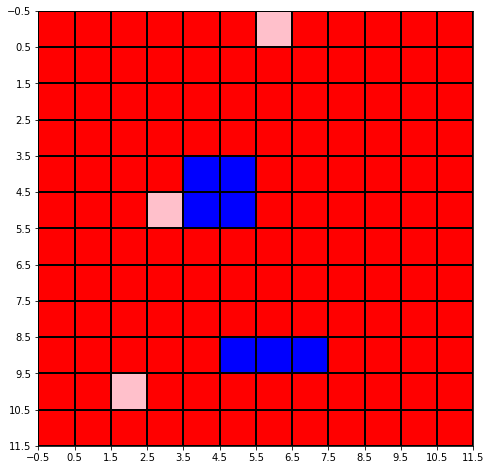

In [ ]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

def Convert(string):
    string=string.replace("[","")
    string=string.replace("]","")
    li = list(string.split(", "))
    li=[float(i) for i in li]
    return li


gain=1
penalty=0.0
size_x=12
size_y=12
mosse_max=200

flag_robot_su_griglia=-1

'''
v_mid=0.5
v_small=0.3
omega_max=0.5
delta_t=np.pi/2
'''


v_mid=0.5
omega_max=0.3
delta_t=(2*np.pi/(8*omega_max))

numero_mosse_massime=[0]
numero_partite_vinte=[0]
reward_listone=[]
lista_aree=[]
sparse_reward=True
girotondi=[0]
def init_reward_grid():
    grid=np.zeros((size_x,size_y))
    somma=0
    c=0
    d=0
    e=0
    f=0
    g=0
    if 0>1:
      while c+d+e+f+g<3:
        c=random.randint(0,1)
        d=random.randint(0,1)
        e=random.randint(0,1)
        f=random.randint(0,1)
        g=random.randint(0,1)
    else:
      c=1
      d=1
      e=1
      f=1
      g=1
    grid[random.randint(0,3),random.randint(0,11)]=c
    grid[random.randint(3,6),random.randint(0,3)]=d
    grid[4:6,4:6]=-2
    grid[9,5:8]=-2
    grid[random.randint(10,11),random.randint(0,11)]=d
    grigliona_pixel=copy.copy(grid)
    for i in range(size_x):
        for j in range(size_y):
            if grigliona_pixel[i,j]>0:
                somma+=grigliona_pixel[i,j]
                grigliona_pixel[i,j]=1
    return grid,somma,grigliona_pixel

cmap = colors.ListedColormap(['blue', 'red','green','pink'])

bounds = [-2,-0.1,0.3,0.7,1]
norm = colors.BoundaryNorm(bounds, cmap.N)
    

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(init_reward_grid()[0], cmap=cmap,norm=norm)
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
ax.set_xticks(np.arange(-0.5, size_y, 1));
        
ax.set_yticks(np.arange(-0.5, size_x, 1)); 





#define a function that determines if the specified location is a terminal state
def is_terminal_state(initial_x, initial_y):
  #if the reward for this location is -1, then it is not a terminal state (i.e., it is a 'white square')
  current_row_index=int(np.round(initial_x))
  current_column_index=int(np.round(initial_y))
  #print(current_row_index,current_column_index)
  reward=0
  lista=env.reward_grid[np.max([0,current_row_index-1]):np.min([current_row_index+2,19]),np.max([current_column_index-1,0]):np.min([current_column_index+2,19])].reshape(-1)
  for i  in range(len(lista)):
      if lista[i]>0:
          reward+=lista[i]

  if reward >0 or env.reward_grid[current_row_index, current_column_index] <-0.5:
    return True
  else:
    
    angolone=env.state[2]*np.pi*2 
    nuovo_x=initial_x+2*np.cos(angolone)*v_mid
    nuovo_y=initial_y+2*np.sin(angolone)*v_mid
    #print('1',nuovo_x,nuovo_y,angolone)
    if env.reward_grid[int(np.round(nuovo_x)), int(np.round(nuovo_y))] <-0.5:
        return True
    else:
        omega_=[omega_max,0,-omega_max]
        for i in omega_:
            c=angolone+2*i
            a=initial_x+2*np.cos(c)*v_mid
            b=initial_y+2*np.sin(c)*v_mid
            #print('2',a,b,c)
            if env.reward_grid[int(np.round(a)), int(np.round(b))] >-0.5:
                return False
    
def ricompensa(lista):
    reward=0
    for i  in range(len(lista)):
        if lista[i]>0:
            reward+=lista[i]
    return reward

def resetta(x,y):
    for i in range(-1,2):
        for j in range(-1,2):
            if x+i<size_x and x+i>=0 and y+j<size_y and y+j>=0:
                if env.reward_grid[x+i,y+j]>0:
                    env.reward_grid[x+i,y+j]=0
                    env.pixel_grid[x+i,y+j]=0
    


#define a function that will choose a random, non-terminal starting location
def get_starting_location():
  #get a random row and column index
  kkk=1#random.randint(0,1)
  if kkk>0:
    #return 11, 19, 0.75# case for huge map
    return 5, 11, 0.75

    '''
    a=random.randint(0,3)
    if a==0:
      return random.randint(1,15), 0, 0.25
    if a==1:
      return 16, random.randint(1,18), 0.5
    if a==2:
      return random.randint(1,15), 19, 0.75
    if a==3:
      return 0,random.randint(1,18),0
      '''
  if kkk==0:
    current_row_index = np.random.randint(1,size_x-2)
    current_column_index = np.random.randint(1,size_y-2)
    #continue choosing random row and column indexes until a non-terminal state is identified
    #(i.e., until the chosen state is a 'white square').
    while env.pixel_grid[current_row_index,current_column_index]<0:
      current_row_index = np.random.randint(1,size_x-2)
      current_column_index = np.random.randint(1,size_y-2)
    #print(env.reward_grid)
    #print(env.reward_grid[current_row_index, current_column_index])
    return current_row_index, current_column_index, np.random.uniform(0,1)



def vectorize_map(map):
    # map è init_pixel_grid() quindi booleana, contiene 1 dove sta la monnezza, 
    # -2 dove stanno le mura, -1 dove sta il robot e il resto 0
    vector = [i for i in np.reshape(map,-1) if i>-2]
    return vector
size=len(vectorize_map(init_reward_grid()[0]))


In [ ]:
import numpy as np
angolone=0
action=0
delta_t=(2*np.pi/(8*0.3))
if action=='dritto':
    new_x=delta_t*np.cos(angolone)*0.5
    new_y=delta_t*np.sin(angolone)*0.5
    print(new_x,new_y)
else:
    
    new_t=delta_t*0.3
    
    new_x=(0.5/0.3)*(np.sin(new_t)-np.sin(angolone))
    new_y=-(0.5/0.3)*(np.cos(new_t)-np.cos(angolone))
    print(new_x,new_y,new_t)

#-2.11

1.1785113019775793 0.4881553646890874 0.7853981633974483


In [ ]:
1.3/0.95



1.368421052631579

In [ ]:



action_list=[
             [v_mid,-omega_max],
             [v_mid,omega_max],
             [v_mid,0],
             ]



class PiazzaDelPopolo(Env):
    

    def __init__(self):
        
        pos_x_init=0
        pos_y_init=0
        theta_in=0
        
        self.reward_grid=[]
        self.pixel_grid=[]
        
        self.state=np.zeros(size+4)
       
        self.state[4:size+4] = np.zeros(size)
        self.state[0:4] = [pos_x_init/size_x,pos_y_init/size_y,theta_in,0]

        #self.action_space = self.action_space = Discrete(len(action_list))
        self.action_space = Discrete(len(action_list))
        highh=np.concatenate((np.array([1,1,1,1]),np.ones(size)))
        loww= np.concatenate((np.array([0,0,0,0]),-np.ones(size)))
        
            
        self.observation_space = Box(low=loww,high=highh)
        # x y theta battery %completata - pixels
        
        # l'area coperta all'inizio è zero quindi manca ancora 1
        self.stato_memoria=[]
        self.action_sequence=list(np.ones(25))
      
        self.mossa=0
    


    def step(self, action):
             
        if self.mossa >mosse_max:
            #print('allora')
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        # metto a zero l'elemento della pixel grid in cui stava prima il robot
        self.pixel_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]=0
        self.mossa+=1
        #if True==False:
        if random.randint(0,15000)==5:
            print('----------')
            print('partite vinte:',numero_partite_vinte[0])
            print('partite con troppe mosse:',numero_mosse_massime[0])
            print('girotondi:',girotondi[0])
            print('area max ultime 100 partite:',np.max(lista_aree[len(lista_aree)-100:]))
            print('----------')
            plt.figure()
            plt.hist(lista_aree[len(lista_aree)-100:])
            plt.show()
        
           #prima -0.5 era troppo
        self.stato_memoria=[self.state[0],self.state[1]]

        self.action_sequence.append(action)
        self.action_sequence=self.action_sequence[1:]
        if self.state[0]<=1 and self.state[0]>=0 and self.state[1]<=1 and self.state[1]>=0:       
            '''
            angolone=self.state[2]*np.pi*2
            self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
            self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)'''
            angolone=self.state[2]*np.pi*2
            if action==2:
                self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
                self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            else:
                
                self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
                
                self.state[0]+=(action_list[action][0]/action_list[action][1])*(np.sin(self.state[2]*2*np.pi)-np.sin(angolone))/(size_x-1)
                self.state[1]-=(action_list[action][0]/action_list[action][1])*(np.cos(self.state[2]*2*np.pi)-np.cos(angolone))/(size_y-1)
          
            
        if self.state[2]>1:
            self.state[2]-=1
        if self.state[2]<0:
            self.state[2]+=1
            
        ollare=False
        if self.state[0]>=1:
            
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[0]<=0:
            
            done=ollare
            reward=-penalty
            #
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]>=1:
            
            done=ollare
            reward=-penalty
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            self.state[0:2]=self.stato_memoria
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]<=0:
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''

        
        if self.reward_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]<-1.6:
            done =ollare
            reward=-penalty
            
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info={}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            

        # battery decrease
        
        
        

        
        pos_x=int(np.round(self.state[0]*(size_x-1)))
        pos_y=int(np.round(self.state[1]*(size_y-1)))

        
        

        # prende il valore della casella : 
        
        reward=ricompensa(self.reward_grid[np.max([0,pos_x-1]):np.min([pos_x+2,19]),np.max([pos_y-1,0]):np.min([pos_y+2,19])].reshape(-1))
        
        # metto a 3 l'elemento della pixel grid in cui sta attualmente il robot
        self.pixel_grid[pos_x,pos_y]=flag_robot_su_griglia

#-------Garbage collected----------------------------------------        
        if reward>0:
            #print('preso',reward)
            #remove garbage from square
            resetta(pos_x,pos_y)
            self.state[3]+=reward/self.somma
        
        # AGGIORNO LO STATO!!!!!! MI ERO DIMENTICATO
        #if len(vectorize_map(self.pixel_grid))>size:
        #  plottagrid(self.pixel_grid.reshape(size_x,size_y))
          
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
         #define a function that determines if the specified location is a terminal state
        
        if self.mossa >mosse_max:
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        else: 
            done=False
            
        if self.state[3]>=0.99:# il 3 è l'AREA COPERTA!!!!
            reward=1
            lista_aree.append(self.state[3])
            numero_partite_vinte[0]+=1
            #print('we')
            done=True
            info={}
            return self.state, reward, done, info
        if self.action_sequence.count(0)>23 or self.action_sequence.count(2)>23:
            girotondi[0]+=1

   
        

        info = {}
        reward=reward*0.5*(1+self.state[3])**2
  

        # Return step information
        return self.state, reward, done, info

       #elif self.action_sequence.count(0)>20 or self.action_sequence.count(2)>20:
       #     print('olle',self.action_sequence)
        #    reward=0
         #   lista_aree.append(self.state[3])
          #  numero_mosse_massime[0]+=1
           # done=False
#elif self.action_sequence.count(0)>25 or self.action_sequence.count(2)>25:
#print('olle',self.action_sequence)
#reward=-1
#lista_aree.append(self.state[3])
#numero_mosse_massime[0]+=1
#done=True

    def render(self):
        pass
    
    
    
    def reset(self):
        self.state=np.zeros(size+4)
        
       
        #print(a)
        
        self.GRIGLIA_INIZIALE=init_reward_grid()

        self.reward_grid=self.GRIGLIA_INIZIALE[0]
        
        
        
        self.somma=self.GRIGLIA_INIZIALE[1]
        #print('somma',self.somma)
        self.pixel_grid=self.GRIGLIA_INIZIALE[2]
        
        pos_x_reset,pos_y_reset,theta_in=get_starting_location() #this is integer
        #theta_in=random.uniform(0,1)
        self.state[2]=theta_in
        #pos_x_reset,pos_y_reset=[11,16]
        self.pixel_grid[pos_x_reset,pos_y_reset]=flag_robot_su_griglia
        
        self.state[0:2] = [pos_x_reset/(size_x-1),pos_y_reset/(size_y-1)]
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
        
     
        self.mossa=0
        
        
        return self.state

# FONDAMENTALE PER CREARE L ENVIRONMENT
env=PiazzaDelPopolo()

def plottagrid(matrice):
    
    px=env.state[0]*(size_x-1)
    py=env.state[1]*(size_y-1)
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    theta=env.state[2]*2*np.pi
    lungo=0.4

    fig, ax = plt.subplots(figsize=(8, 8))
   
    ax.imshow(matrice, cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));
        
    ax.set_yticks(np.arange(-0.5, 17, 1)); 
 
    plt.plot([py,py+lungo*np.sin(theta)],[px,px+lungo*np.cos(theta)],linewidth=5,color='white')
    plt.plot(py, px, marker="o", markersize=15, markeredgecolor="white", markerfacecolor="white")


/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


'\nfrom google.colab import files\nplt.savefig("sample.jpg", dpi=150)\nfiles.download("sample.jpg")'

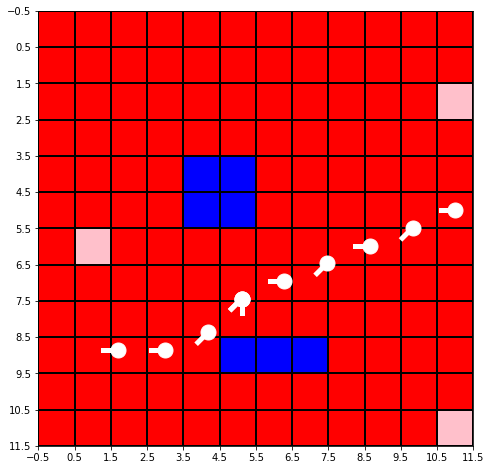

In [ ]:
episodes = 1
for episode in range(1, episodes+1):
    env.reset()
    #print(np.multiply(env.reset()[0:2],size))
    #print(env.reward_grid)
    #print('batteria',env.state[3])
    done = False
    score = 0 
    plottagrid(env.reward_grid)
    #while not done:
    for i in range(10):
        if done==True:
          print('cazzo')
          print(score, env.mossa,[env.state[3],env.state[5],env.state[7],env.state[9]].count(-1))
          print([env.state[3],env.state[5],env.state[7],env.state[9]])
          break
        #env.render()
        #temp=[env.state[0],env.state[1]]
        action = env.action_space.sample()
        #action = 0
        n_state, reward, done, info = env.step(action)
        #print(np.round(env.reward_grid,2))
        score+=reward
        #print(np.round(env.pixel_grid,1))
        plt.plot([env.state[1]*(size_y-1),env.state[1]*(size_y-1)+0.4*np.sin(env.state[2]*2*np.pi)],[env.state[0]*(size_x-1),env.state[0]*(size_x-1)+0.4*np.cos(env.state[2]*2*np.pi)],linewidth=5,color='white')
        plt.plot(env.state[1]*(size_y-1), env.state[0]*(size_x-1), marker="o", markersize=15, markeredgecolor="white", markerfacecolor="white")

'''
from google.colab import files
plt.savefig("sample.jpg", dpi=150)
files.download("sample.jpg")'''
       

In [ ]:
a=[0,1,1,1,1,1,0,1]
a.count([1,1,1,1,1])

0

### modello

In [ ]:
class Schedule(object):
    def value(self, step):
        """
        Value of the schedule for a given timestep

        :param step: (int) the timestep
        :return: (float) the output value for the given timestep
        """
        raise NotImplementedError

def get_linear_fn(start: float, end: float, end_fraction: float) -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        if (1 - progress_remaining) > end_fraction:
            return end
        if progress_remaining > end_fraction:
            return end
        else:
            return start + (1 - progress_remaining) * (end - start) / end_fraction

    return func



def learning_rate_custom() -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.1:
            return 0.00013
        if progress_remaining < 0.2:
            return 0.00011
        if progress_remaining < 0.3:
            return 0.0001
        if progress_remaining < 0.4:
            return 0.00009
        if progress_remaining < 0.5:
            return 0.00008
        if progress_remaining < 0.6:
            return 0.00006
        if progress_remaining < 0.7:
            return 0.00005
        if progress_remaining < 0.8:
            return 0.00003
        if progress_remaining < 0.9:
            return 0.00001
        else:
            return 0.00001

    return func

In [ ]:
#0.0000065
lrr=0.000019#0.00005,grigia,#0.00004,#0.000035
# 300 k at 0.0002
# 500 k at 0.0001
# 300 k at 0.00007
# 300 k at 0.00005
# 300 k at 0.00002
# 1 M at 0.00001
# 1 M at 0.000009
'''
policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[400, 400,400], vf=[400, 400,400])])'''

policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[300, 300,300], vf=[300, 300,300])])

primo_allenamento=True

# n_steps was 400, architecture [300, 300] , n_epochs=8

if primo_allenamento:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs,ent_coef=0.0, gamma=0.995,verbose=0,learning_rate=learning_rate_custom(),n_steps=2000,n_epochs=4,batch_size=400,tensorboard_log="./pixies_tensorboard/")
else:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs, ent_coef=0.0,gamma=0.995,verbose=0,learning_rate=0.000007,n_steps=2000,n_epochs=4,batch_size=400,tensorboard_log="./pixies_tensorboard/")
    model.set_parameters('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_2_SMALL_MAP_300_300_300/MODELLO_STRUCTURE_2_SMALL_MAP.zip')
    #model.set_parameters('weee.zip')
#ent_coef=0.0

#stable_baselines3.ppo.PPO(policy, env, learning_rate=0.0003, 
#                           n_steps=2048, batch_size=64, n_epochs=10, gamma=0.99,
#                            gae_lambda=0.95, clip_range=0.2, clip_range_vf=None, 
#                           normalize_advantage=True, ent_coef=0.0, vf_coef=0.5, max_grad_norm=0.5,
#                              use_sde=False, sde_sample_freq=-1, target_kl=None, tensorboard_log=None, 
#                           create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, device='auto',
#                            _init_setup_model=True)

In fact, Stable-Baselines3 already provides you with that helper:

In [ ]:
from stable_baselines3.common.evaluation import evaluate_policy

Let's evaluate the un-trained agent, this should be a random agent.

## Train the agent and evaluate it

In [ ]:
# test with 100,100,100 MLP 
# test with 200,100,100
print(144*100+100*100+100*100+100*3,144*200+100*100+100*100+100*3)

34700 49100


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./pixies_tensorboard/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

----------
partite vinte: 201908
partite con troppe mosse: 7860
girotondi: 163011
area max ultime 100 partite: 1.0
----------


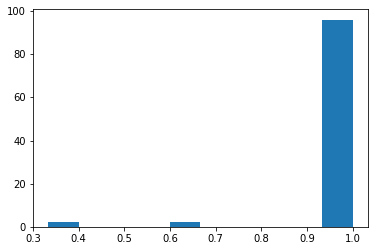

----------
partite vinte: 201967
partite con troppe mosse: 7899
girotondi: 163011
area max ultime 100 partite: 1.0
----------


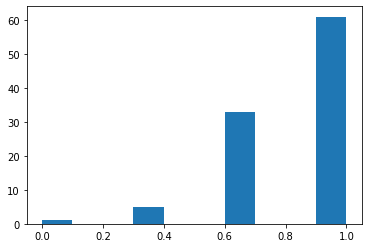

----------
partite vinte: 202014
partite con troppe mosse: 7921
girotondi: 163011
area max ultime 100 partite: 1.0
----------


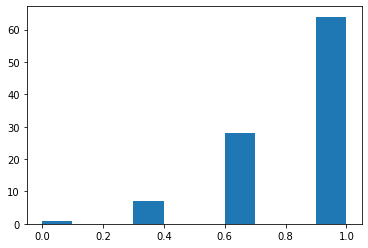

----------
partite vinte: 202042
partite con troppe mosse: 7941
girotondi: 163011
area max ultime 100 partite: 1.0
----------


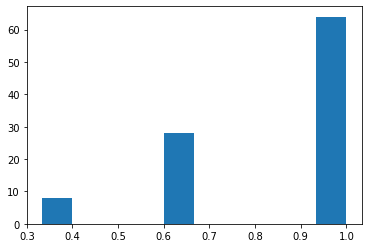

----------
partite vinte: 202063
partite con troppe mosse: 7963
girotondi: 163011
area max ultime 100 partite: 1.0
----------


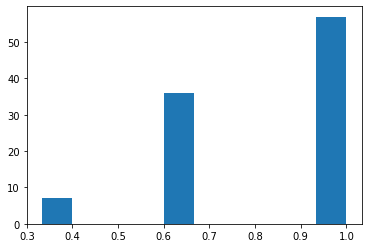

----------
partite vinte: 202075
partite con troppe mosse: 7965
girotondi: 163011
area max ultime 100 partite: 1.0
----------


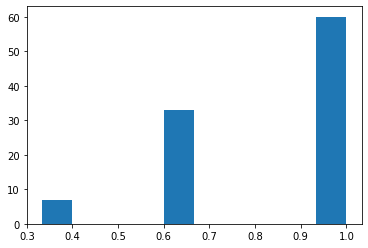

----------
partite vinte: 202099
partite con troppe mosse: 7983
girotondi: 163011
area max ultime 100 partite: 1.0
----------


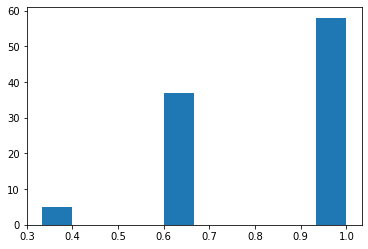

----------
partite vinte: 202117
partite con troppe mosse: 8000
girotondi: 163011
area max ultime 100 partite: 1.0
----------


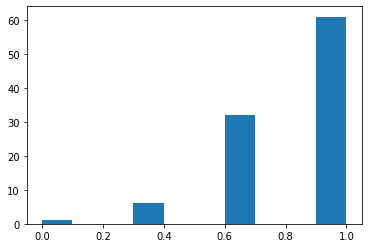

----------
partite vinte: 202154
partite con troppe mosse: 8024
girotondi: 163011
area max ultime 100 partite: 1.0
----------


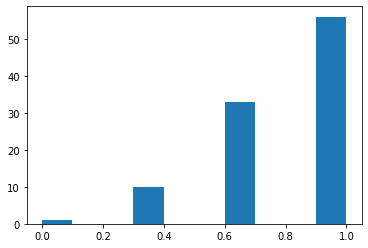

----------
partite vinte: 202170
partite con troppe mosse: 8047
girotondi: 163011
area max ultime 100 partite: 1.0
----------


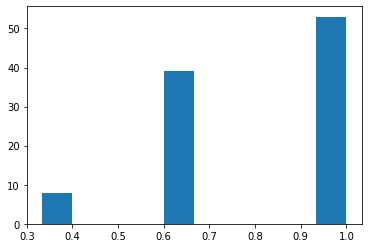

----------
partite vinte: 202275
partite con troppe mosse: 8117
girotondi: 163011
area max ultime 100 partite: 1.0
----------


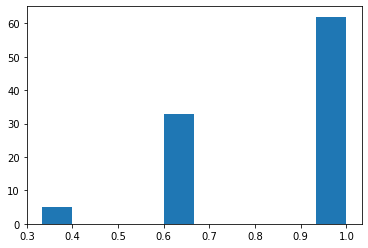

----------
partite vinte: 202335
partite con troppe mosse: 8165
girotondi: 163011
area max ultime 100 partite: 1.0
----------


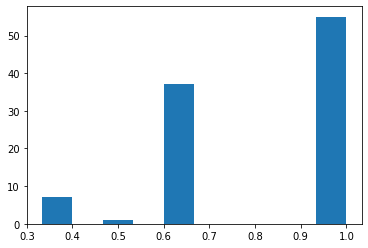

----------
partite vinte: 202353
partite con troppe mosse: 8177
girotondi: 163011
area max ultime 100 partite: 1.0
----------


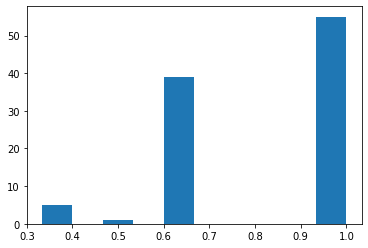

----------
partite vinte: 202387
partite con troppe mosse: 8195
girotondi: 163011
area max ultime 100 partite: 1.0
----------


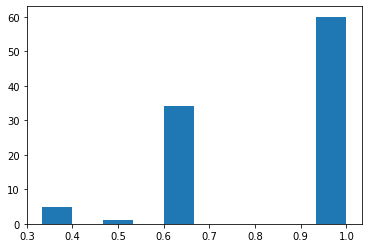

----------
partite vinte: 202413
partite con troppe mosse: 8214
girotondi: 163011
area max ultime 100 partite: 1.0
----------


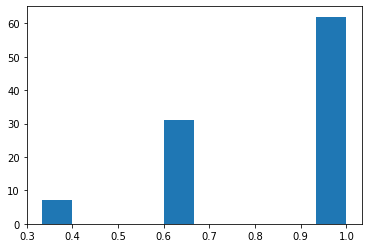

----------
partite vinte: 202429
partite con troppe mosse: 8221
girotondi: 163011
area max ultime 100 partite: 1.0
----------


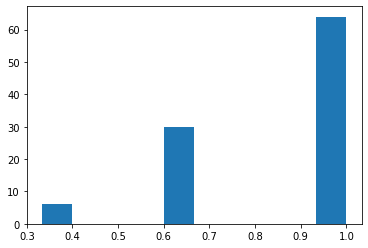

----------
partite vinte: 202581
partite con troppe mosse: 8304
girotondi: 163011
area max ultime 100 partite: 1.0
----------


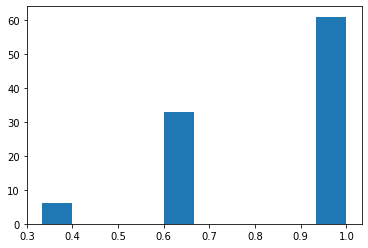

----------
partite vinte: 202674
partite con troppe mosse: 8348
girotondi: 163011
area max ultime 100 partite: 1.0
----------


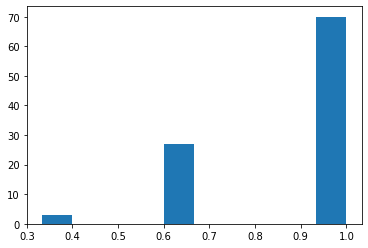

----------
partite vinte: 202705
partite con troppe mosse: 8364
girotondi: 163011
area max ultime 100 partite: 1.0
----------


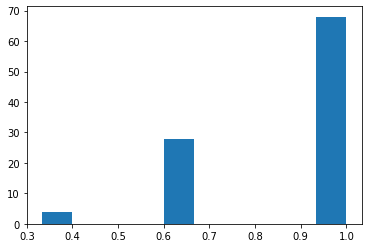

----------
partite vinte: 202781
partite con troppe mosse: 8403
girotondi: 163011
area max ultime 100 partite: 1.0
----------


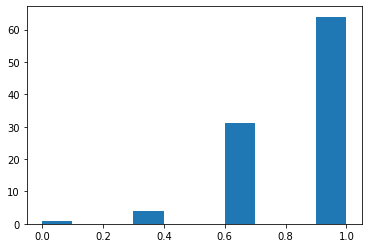

----------
partite vinte: 202847
partite con troppe mosse: 8437
girotondi: 163011
area max ultime 100 partite: 1.0
----------


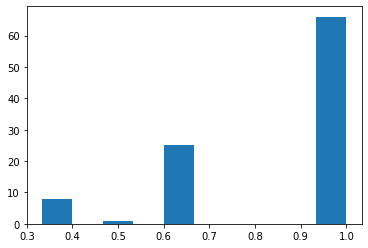

----------
partite vinte: 202894
partite con troppe mosse: 8461
girotondi: 163011
area max ultime 100 partite: 1.0
----------


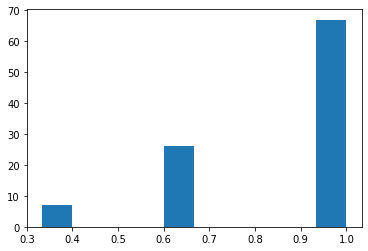

----------
partite vinte: 203009
partite con troppe mosse: 8530
girotondi: 163011
area max ultime 100 partite: 1.0
----------


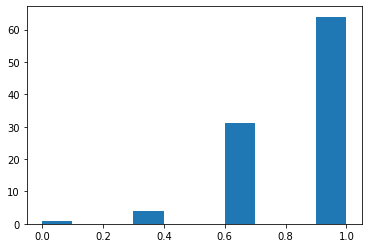

----------
partite vinte: 203078
partite con troppe mosse: 8557
girotondi: 163011
area max ultime 100 partite: 1.0
----------


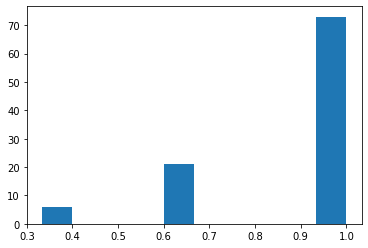

----------
partite vinte: 203153
partite con troppe mosse: 8593
girotondi: 163011
area max ultime 100 partite: 1.0
----------


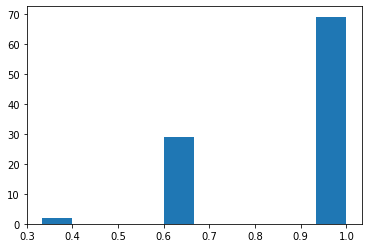

----------
partite vinte: 203238
partite con troppe mosse: 8635
girotondi: 163011
area max ultime 100 partite: 1.0
----------


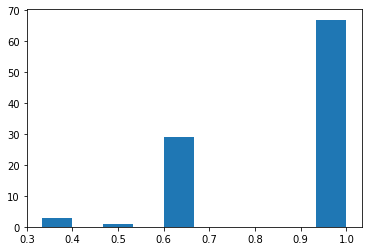

----------
partite vinte: 203357
partite con troppe mosse: 8682
girotondi: 163011
area max ultime 100 partite: 1.0
----------


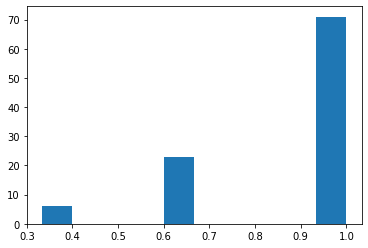

----------
partite vinte: 203405
partite con troppe mosse: 8713
girotondi: 163011
area max ultime 100 partite: 1.0
----------


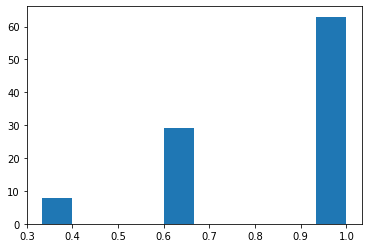

----------
partite vinte: 203541
partite con troppe mosse: 8787
girotondi: 163011
area max ultime 100 partite: 1.0
----------


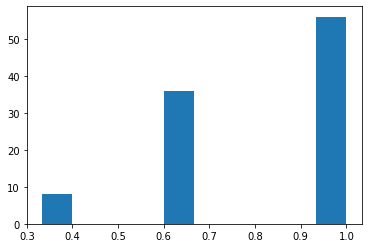

----------
partite vinte: 203638
partite con troppe mosse: 8832
girotondi: 163011
area max ultime 100 partite: 1.0
----------


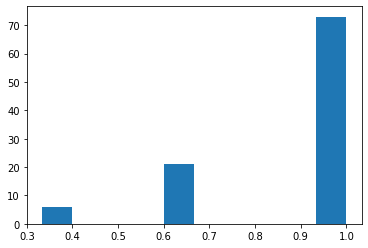

----------
partite vinte: 203659
partite con troppe mosse: 8840
girotondi: 163011
area max ultime 100 partite: 1.0
----------


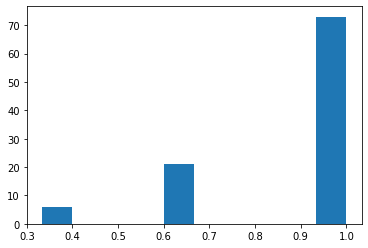

----------
partite vinte: 203671
partite con troppe mosse: 8844
girotondi: 163011
area max ultime 100 partite: 1.0
----------


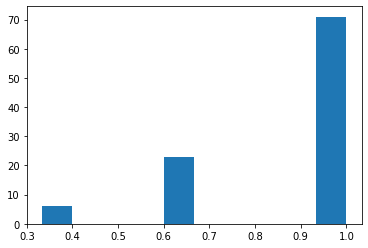

----------
partite vinte: 203784
partite con troppe mosse: 8910
girotondi: 163011
area max ultime 100 partite: 1.0
----------


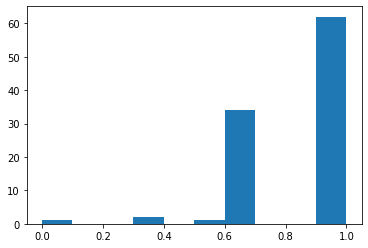

----------
partite vinte: 203924
partite con troppe mosse: 8952
girotondi: 163011
area max ultime 100 partite: 1.0
----------


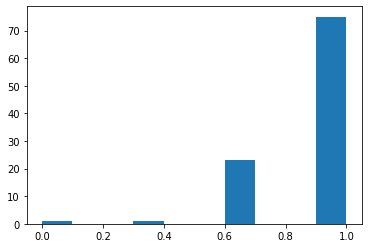

----------
partite vinte: 204027
partite con troppe mosse: 8996
girotondi: 163011
area max ultime 100 partite: 1.0
----------


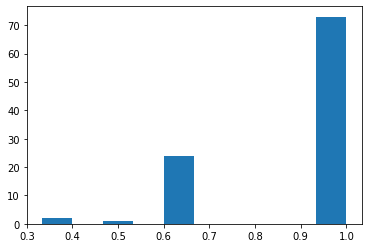

----------
partite vinte: 204061
partite con troppe mosse: 9008
girotondi: 163011
area max ultime 100 partite: 1.0
----------


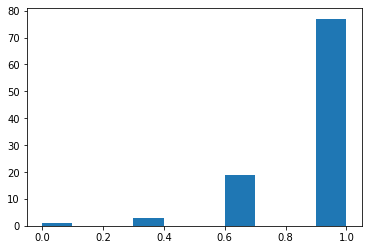

----------
partite vinte: 204072
partite con troppe mosse: 9013
girotondi: 163011
area max ultime 100 partite: 1.0
----------


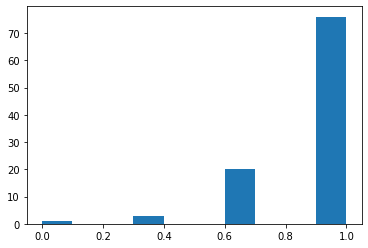

----------
partite vinte: 204130
partite con troppe mosse: 9034
girotondi: 163011
area max ultime 100 partite: 1.0
----------


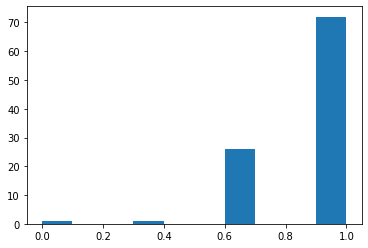

----------
partite vinte: 204238
partite con troppe mosse: 9088
girotondi: 163011
area max ultime 100 partite: 1.0
----------


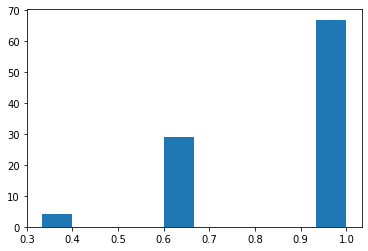

----------
partite vinte: 204393
partite con troppe mosse: 9154
girotondi: 163011
area max ultime 100 partite: 1.0
----------


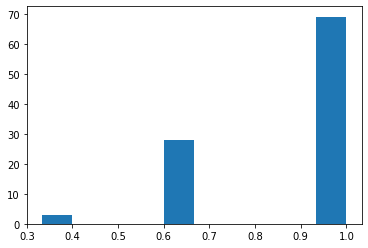

----------
partite vinte: 204508
partite con troppe mosse: 9202
girotondi: 163011
area max ultime 100 partite: 1.0
----------


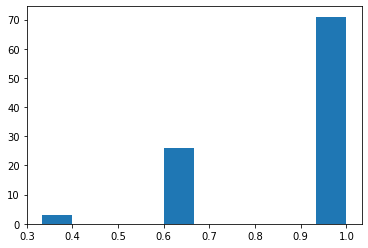

----------
partite vinte: 204779
partite con troppe mosse: 9306
girotondi: 163011
area max ultime 100 partite: 1.0
----------


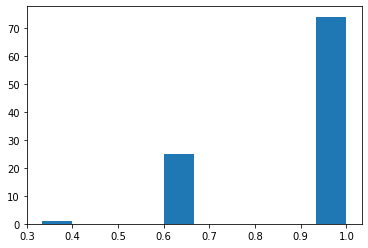

----------
partite vinte: 204830
partite con troppe mosse: 9331
girotondi: 163011
area max ultime 100 partite: 1.0
----------


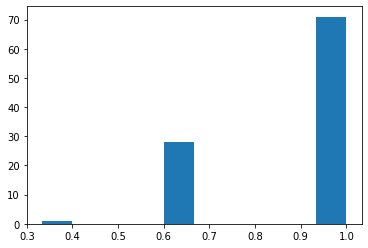

----------
partite vinte: 204990
partite con troppe mosse: 9381
girotondi: 163011
area max ultime 100 partite: 1.0
----------


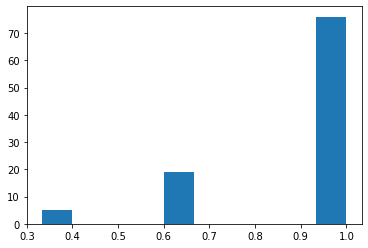

----------
partite vinte: 205180
partite con troppe mosse: 9439
girotondi: 163011
area max ultime 100 partite: 1.0
----------


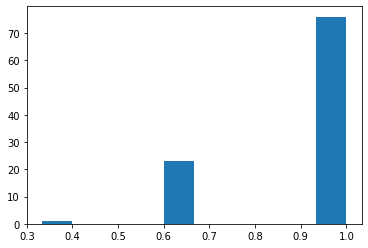

----------
partite vinte: 205308
partite con troppe mosse: 9475
girotondi: 163011
area max ultime 100 partite: 1.0
----------


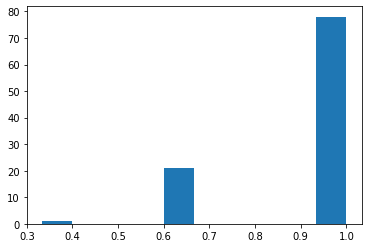

----------
partite vinte: 205312
partite con troppe mosse: 9479
girotondi: 163011
area max ultime 100 partite: 1.0
----------


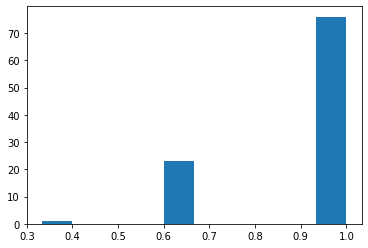

----------
partite vinte: 205365
partite con troppe mosse: 9492
girotondi: 163011
area max ultime 100 partite: 1.0
----------


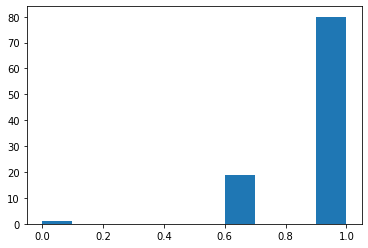

----------
partite vinte: 205544
partite con troppe mosse: 9540
girotondi: 163011
area max ultime 100 partite: 1.0
----------


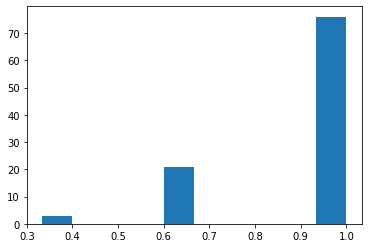

----------
partite vinte: 205552
partite con troppe mosse: 9542
girotondi: 163011
area max ultime 100 partite: 1.0
----------


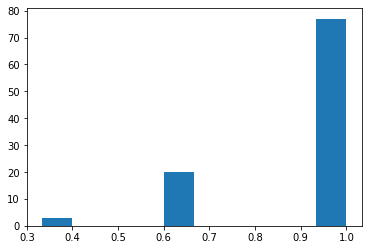

----------
partite vinte: 205581
partite con troppe mosse: 9547
girotondi: 163011
area max ultime 100 partite: 1.0
----------


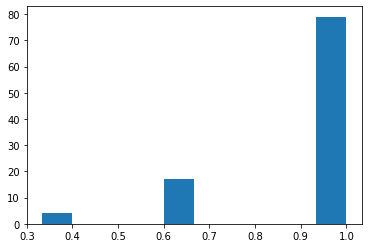

----------
partite vinte: 205655
partite con troppe mosse: 9563
girotondi: 163011
area max ultime 100 partite: 1.0
----------


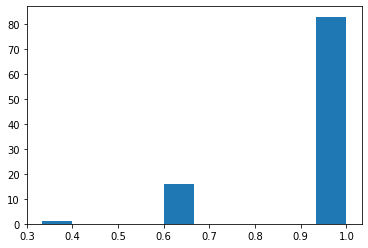

----------
partite vinte: 205689
partite con troppe mosse: 9571
girotondi: 163011
area max ultime 100 partite: 1.0
----------


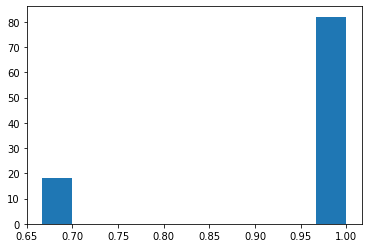

----------
partite vinte: 205700
partite con troppe mosse: 9575
girotondi: 163011
area max ultime 100 partite: 1.0
----------


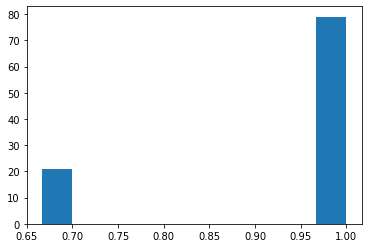

----------
partite vinte: 206071
partite con troppe mosse: 9677
girotondi: 163021
area max ultime 100 partite: 1.0
----------


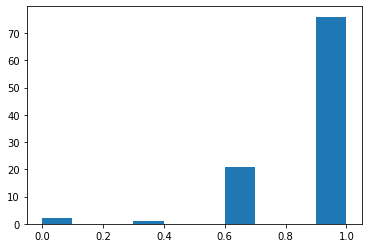

----------
partite vinte: 206125
partite con troppe mosse: 9689
girotondi: 163021
area max ultime 100 partite: 1.0
----------


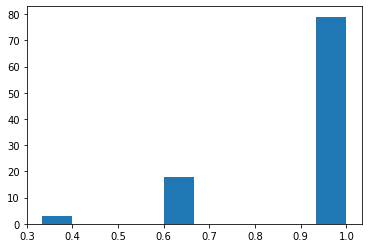

----------
partite vinte: 206176
partite con troppe mosse: 9700
girotondi: 163021
area max ultime 100 partite: 1.0
----------


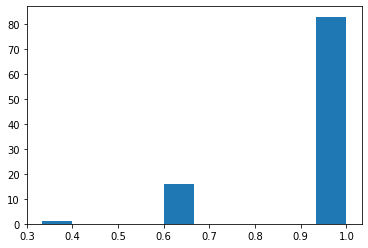

----------
partite vinte: 206203
partite con troppe mosse: 9705
girotondi: 163021
area max ultime 100 partite: 1.0
----------


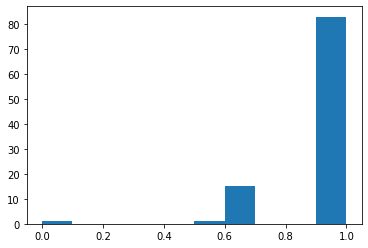

----------
partite vinte: 206223
partite con troppe mosse: 9708
girotondi: 163021
area max ultime 100 partite: 1.0
----------


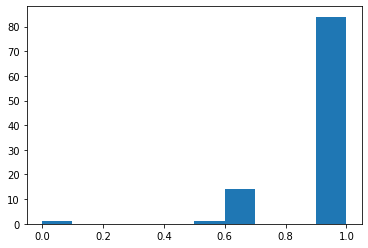

----------
partite vinte: 206291
partite con troppe mosse: 9721
girotondi: 163021
area max ultime 100 partite: 1.0
----------


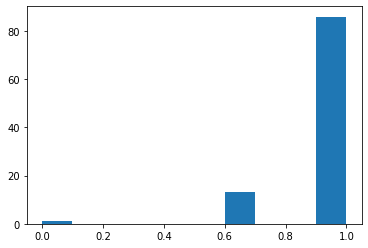

----------
partite vinte: 206498
partite con troppe mosse: 9774
girotondi: 163025
area max ultime 100 partite: 1.0
----------


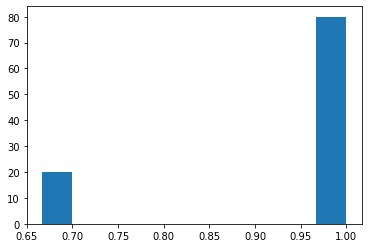

----------
partite vinte: 206675
partite con troppe mosse: 9809
girotondi: 163025
area max ultime 100 partite: 1.0
----------


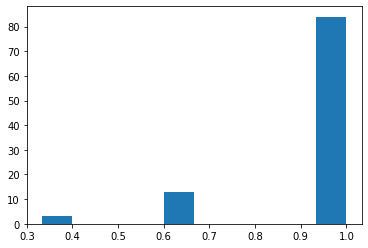

----------
partite vinte: 206719
partite con troppe mosse: 9816
girotondi: 163025
area max ultime 100 partite: 1.0
----------


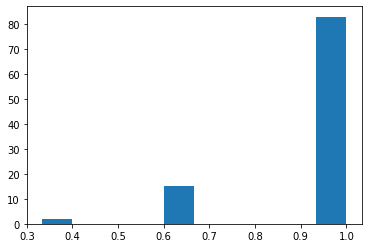

----------
partite vinte: 206742
partite con troppe mosse: 9816
girotondi: 163025
area max ultime 100 partite: 1.0
----------


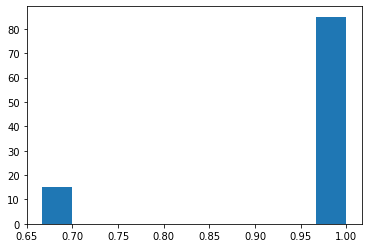

----------
partite vinte: 206764
partite con troppe mosse: 9821
girotondi: 163025
area max ultime 100 partite: 1.0
----------


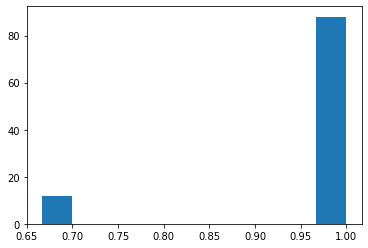

----------
partite vinte: 206912
partite con troppe mosse: 9849
girotondi: 163025
area max ultime 100 partite: 1.0
----------


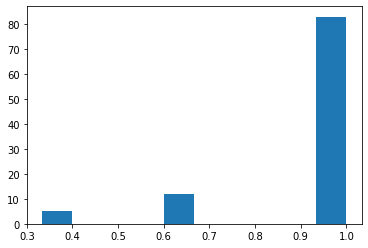

----------
partite vinte: 207030
partite con troppe mosse: 9868
girotondi: 163025
area max ultime 100 partite: 1.0
----------


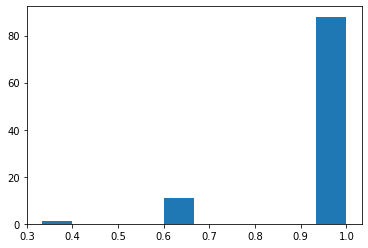

----------
partite vinte: 207054
partite con troppe mosse: 9870
girotondi: 163025
area max ultime 100 partite: 1.0
----------


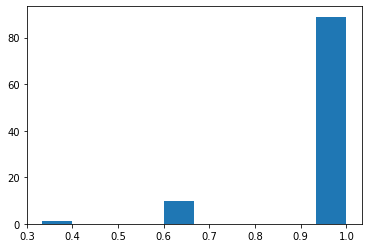

----------
partite vinte: 207204
partite con troppe mosse: 9901
girotondi: 163027
area max ultime 100 partite: 1.0
----------


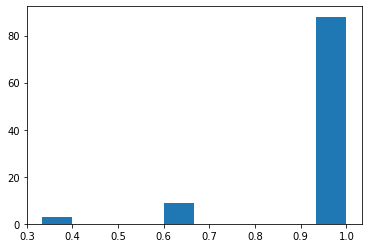

----------
partite vinte: 207211
partite con troppe mosse: 9903
girotondi: 163027
area max ultime 100 partite: 1.0
----------


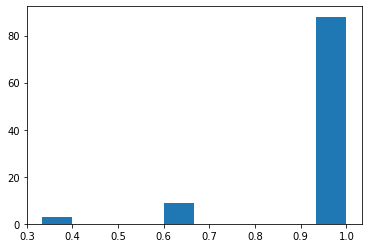

----------
partite vinte: 207294
partite con troppe mosse: 9919
girotondi: 163035
area max ultime 100 partite: 1.0
----------


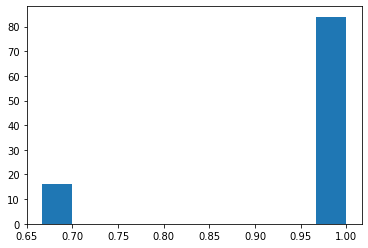

----------
partite vinte: 207515
partite con troppe mosse: 9969
girotondi: 163048
area max ultime 100 partite: 1.0
----------


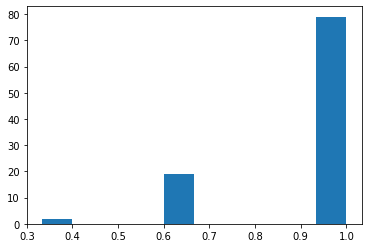

----------
partite vinte: 207572
partite con troppe mosse: 9982
girotondi: 163048
area max ultime 100 partite: 1.0
----------


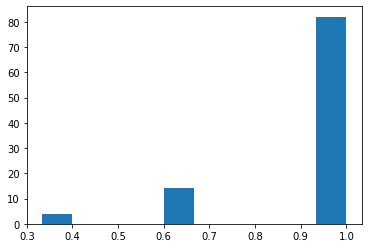

----------
partite vinte: 207988
partite con troppe mosse: 10064
girotondi: 163088
area max ultime 100 partite: 1.0
----------


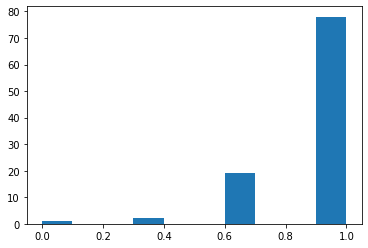

----------
partite vinte: 208311
partite con troppe mosse: 10111
girotondi: 163090
area max ultime 100 partite: 1.0
----------


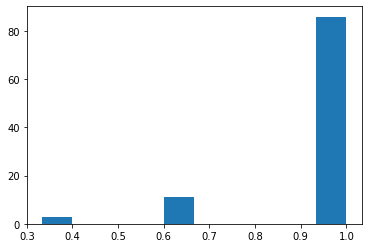

----------
partite vinte: 208324
partite con troppe mosse: 10112
girotondi: 163090
area max ultime 100 partite: 1.0
----------


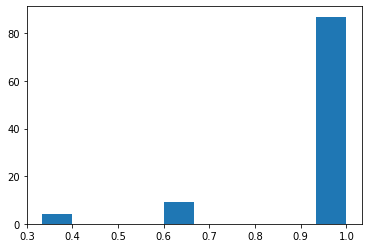

----------
partite vinte: 208441
partite con troppe mosse: 10127
girotondi: 163158
area max ultime 100 partite: 1.0
----------


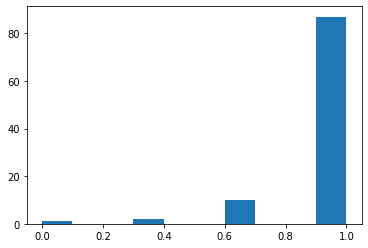

----------
partite vinte: 208750
partite con troppe mosse: 10184
girotondi: 163165
area max ultime 100 partite: 1.0
----------


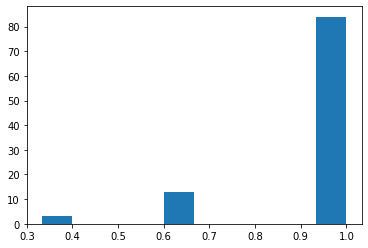

----------
partite vinte: 208825
partite con troppe mosse: 10192
girotondi: 163195
area max ultime 100 partite: 1.0
----------


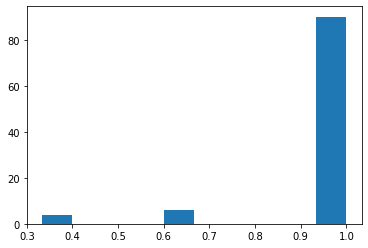

----------
partite vinte: 208827
partite con troppe mosse: 10192
girotondi: 163195
area max ultime 100 partite: 1.0
----------


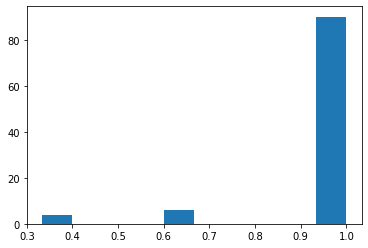

----------
partite vinte: 208842
partite con troppe mosse: 10195
girotondi: 163195
area max ultime 100 partite: 1.0
----------


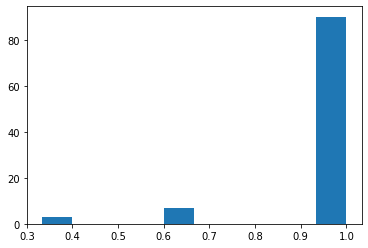

----------
partite vinte: 208890
partite con troppe mosse: 10203
girotondi: 163201
area max ultime 100 partite: 1.0
----------


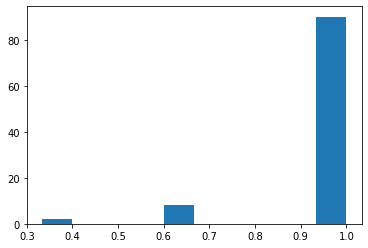

----------
partite vinte: 208933
partite con troppe mosse: 10208
girotondi: 163216
area max ultime 100 partite: 1.0
----------


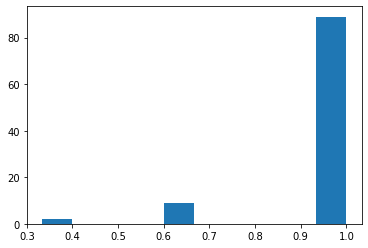

----------
partite vinte: 208936
partite con troppe mosse: 10208
girotondi: 163216
area max ultime 100 partite: 1.0
----------


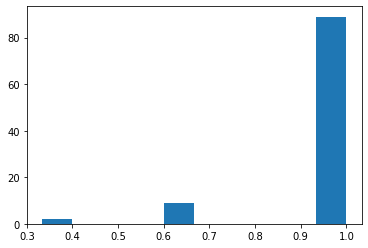

----------
partite vinte: 209347
partite con troppe mosse: 10272
girotondi: 163297
area max ultime 100 partite: 1.0
----------


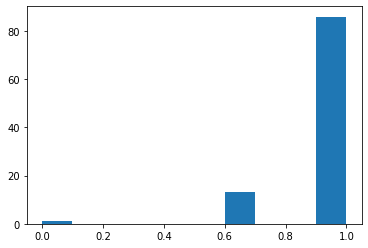

----------
partite vinte: 209392
partite con troppe mosse: 10281
girotondi: 163297
area max ultime 100 partite: 1.0
----------


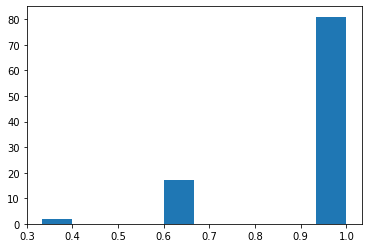

----------
partite vinte: 209454
partite con troppe mosse: 10294
girotondi: 163325
area max ultime 100 partite: 1.0
----------


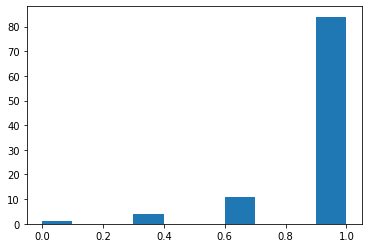

----------
partite vinte: 209588
partite con troppe mosse: 10308
girotondi: 163349
area max ultime 100 partite: 1.0
----------


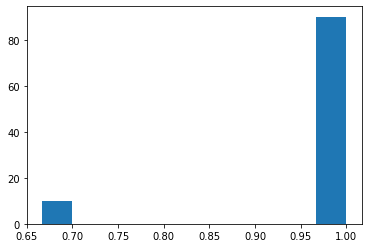

----------
partite vinte: 209833
partite con troppe mosse: 10338
girotondi: 163494
area max ultime 100 partite: 1.0
----------


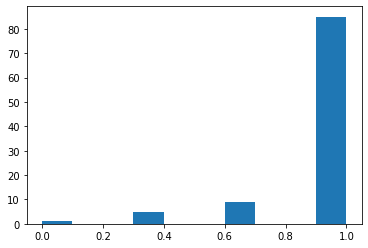

----------
partite vinte: 209843
partite con troppe mosse: 10339
girotondi: 163494
area max ultime 100 partite: 1.0
----------


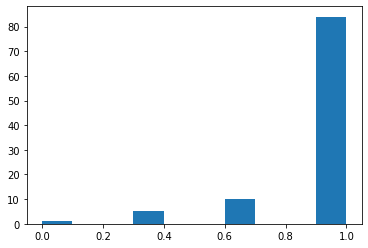

----------
partite vinte: 210600
partite con troppe mosse: 10435
girotondi: 163709
area max ultime 100 partite: 1.0
----------


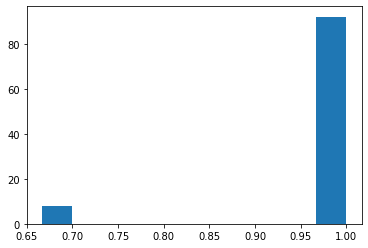

----------
partite vinte: 210650
partite con troppe mosse: 10442
girotondi: 163722
area max ultime 100 partite: 1.0
----------


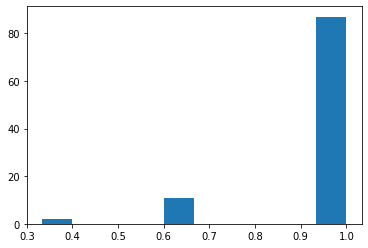

----------
partite vinte: 210991
partite con troppe mosse: 10484
girotondi: 163811
area max ultime 100 partite: 1.0
----------


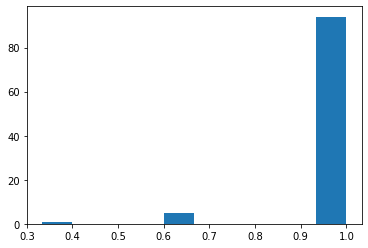

----------
partite vinte: 211288
partite con troppe mosse: 10517
girotondi: 164026
area max ultime 100 partite: 1.0
----------


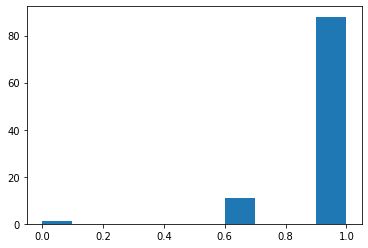

----------
partite vinte: 211301
partite con troppe mosse: 10520
girotondi: 164026
area max ultime 100 partite: 1.0
----------


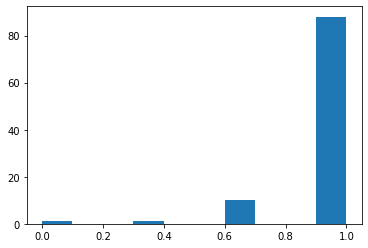

----------
partite vinte: 211488
partite con troppe mosse: 10540
girotondi: 164080
area max ultime 100 partite: 1.0
----------


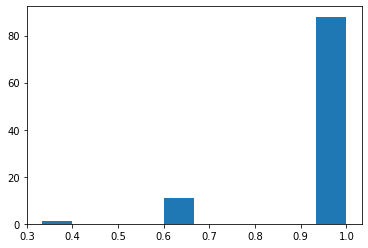

----------
partite vinte: 211619
partite con troppe mosse: 10551
girotondi: 164118
area max ultime 100 partite: 1.0
----------


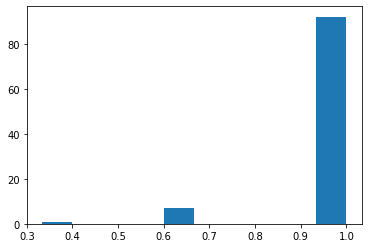

----------
partite vinte: 211849
partite con troppe mosse: 10570
girotondi: 164132
area max ultime 100 partite: 1.0
----------


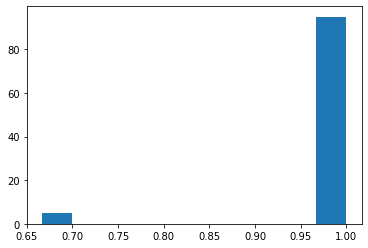

----------
partite vinte: 211881
partite con troppe mosse: 10572
girotondi: 164214
area max ultime 100 partite: 1.0
----------


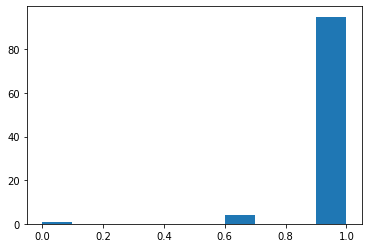

----------
partite vinte: 211949
partite con troppe mosse: 10582
girotondi: 164313
area max ultime 100 partite: 1.0
----------


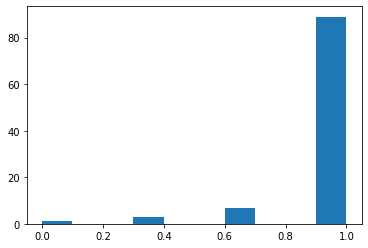

----------
partite vinte: 212016
partite con troppe mosse: 10589
girotondi: 164313
area max ultime 100 partite: 1.0
----------


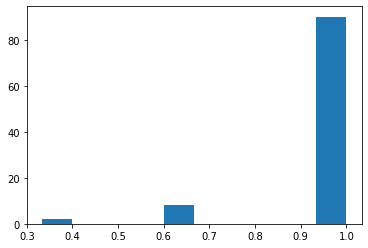

----------
partite vinte: 212133
partite con troppe mosse: 10599
girotondi: 164399
area max ultime 100 partite: 1.0
----------


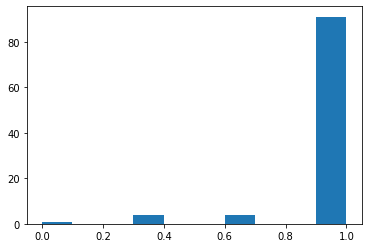

----------
partite vinte: 212207
partite con troppe mosse: 10605
girotondi: 164399
area max ultime 100 partite: 1.0
----------


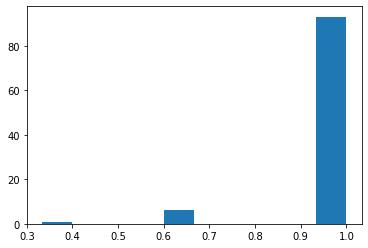

----------
partite vinte: 212332
partite con troppe mosse: 10619
girotondi: 164415
area max ultime 100 partite: 1.0
----------


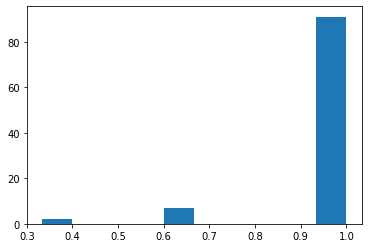

----------
partite vinte: 212366
partite con troppe mosse: 10621
girotondi: 164421
area max ultime 100 partite: 1.0
----------


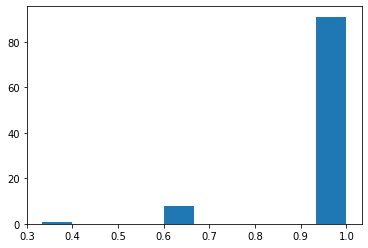

----------
partite vinte: 212694
partite con troppe mosse: 10652
girotondi: 164490
area max ultime 100 partite: 1.0
----------


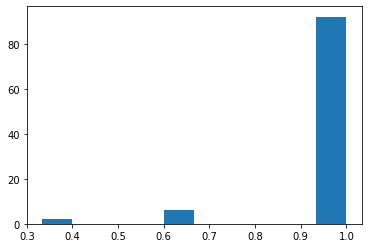

----------
partite vinte: 212705
partite con troppe mosse: 10653
girotondi: 164490
area max ultime 100 partite: 1.0
----------


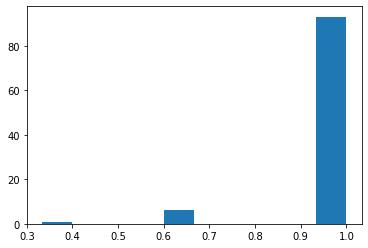

----------
partite vinte: 212775
partite con troppe mosse: 10659
girotondi: 164545
area max ultime 100 partite: 1.0
----------


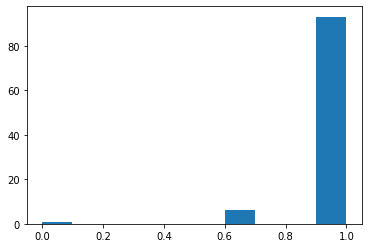

----------
partite vinte: 212829
partite con troppe mosse: 10664
girotondi: 164561
area max ultime 100 partite: 1.0
----------


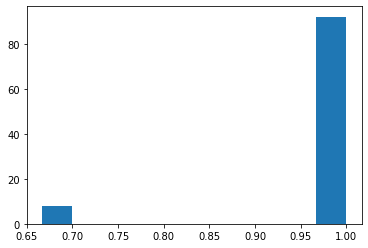

----------
partite vinte: 213298
partite con troppe mosse: 10686
girotondi: 164825
area max ultime 100 partite: 1.0
----------


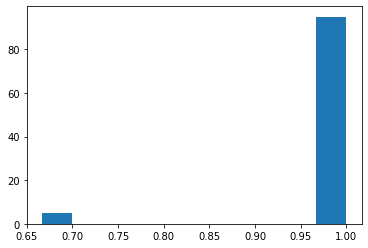

----------
partite vinte: 213486
partite con troppe mosse: 10707
girotondi: 165022
area max ultime 100 partite: 1.0
----------


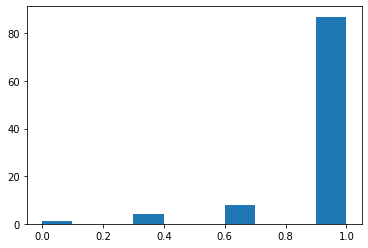

----------
partite vinte: 213533
partite con troppe mosse: 10709
girotondi: 165022
area max ultime 100 partite: 1.0
----------


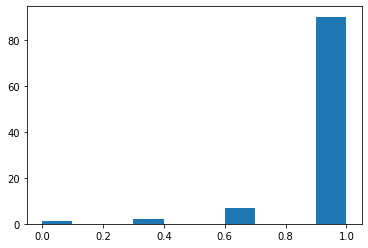

----------
partite vinte: 213549
partite con troppe mosse: 10711
girotondi: 165022
area max ultime 100 partite: 1.0
----------


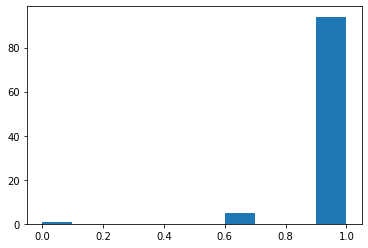

----------
partite vinte: 213598
partite con troppe mosse: 10715
girotondi: 165061
area max ultime 100 partite: 1.0
----------


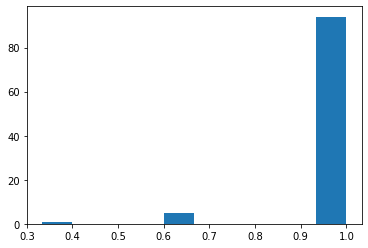

----------
partite vinte: 213829
partite con troppe mosse: 10739
girotondi: 165200
area max ultime 100 partite: 1.0
----------


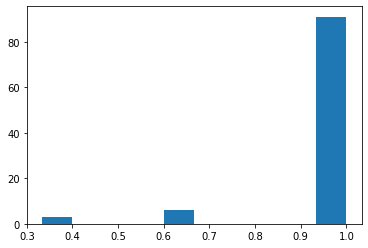

----------
partite vinte: 213902
partite con troppe mosse: 10749
girotondi: 165286
area max ultime 100 partite: 1.0
----------


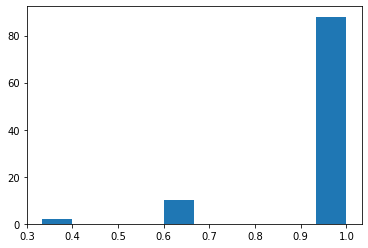

----------
partite vinte: 213916
partite con troppe mosse: 10752
girotondi: 165330
area max ultime 100 partite: 1.0
----------


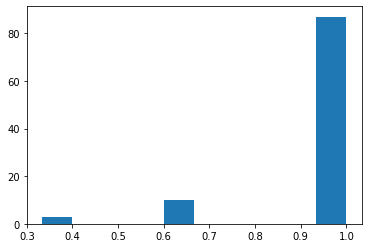

----------
partite vinte: 213935
partite con troppe mosse: 10753
girotondi: 165330
area max ultime 100 partite: 1.0
----------


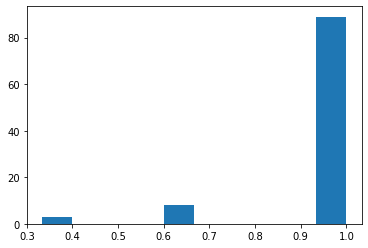

----------
partite vinte: 214047
partite con troppe mosse: 10764
girotondi: 165386
area max ultime 100 partite: 1.0
----------


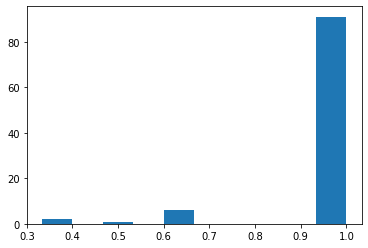

----------
partite vinte: 214089
partite con troppe mosse: 10773
girotondi: 165453
area max ultime 100 partite: 1.0
----------


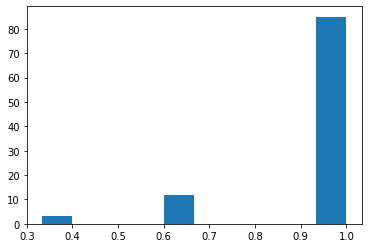

----------
partite vinte: 214158
partite con troppe mosse: 10779
girotondi: 165649
area max ultime 100 partite: 1.0
----------


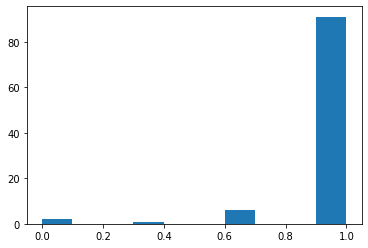

----------
partite vinte: 214562
partite con troppe mosse: 10811
girotondi: 165935
area max ultime 100 partite: 1.0
----------


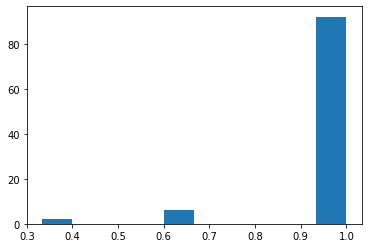

----------
partite vinte: 214568
partite con troppe mosse: 10811
girotondi: 165935
area max ultime 100 partite: 1.0
----------


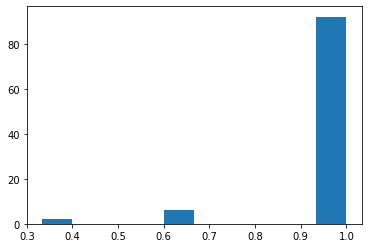

----------
partite vinte: 215169
partite con troppe mosse: 10858
girotondi: 166431
area max ultime 100 partite: 1.0
----------


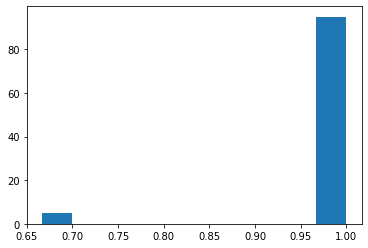

----------
partite vinte: 215250
partite con troppe mosse: 10866
girotondi: 166526
area max ultime 100 partite: 1.0
----------


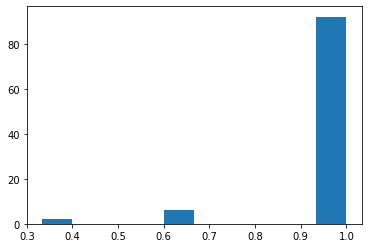

----------
partite vinte: 215272
partite con troppe mosse: 10867
girotondi: 166526
area max ultime 100 partite: 1.0
----------


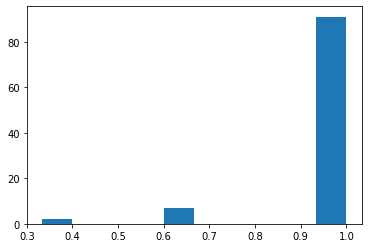

----------
partite vinte: 215810
partite con troppe mosse: 10904
girotondi: 167011
area max ultime 100 partite: 1.0
----------


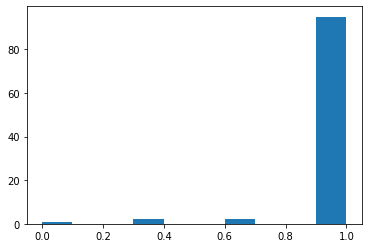

----------
partite vinte: 215923
partite con troppe mosse: 10920
girotondi: 167273
area max ultime 100 partite: 1.0
----------


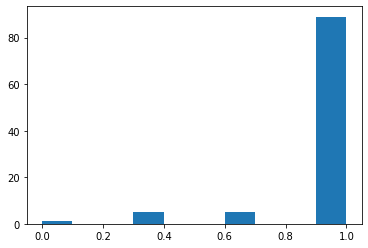

----------
partite vinte: 215955
partite con troppe mosse: 10923
girotondi: 167327
area max ultime 100 partite: 1.0
----------


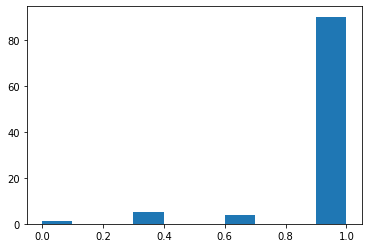

----------
partite vinte: 216075
partite con troppe mosse: 10928
girotondi: 167344
area max ultime 100 partite: 1.0
----------


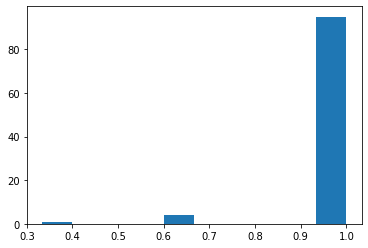

----------
partite vinte: 216245
partite con troppe mosse: 10939
girotondi: 167728
area max ultime 100 partite: 1.0
----------


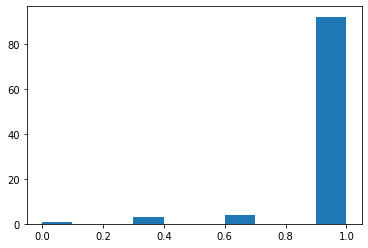

----------
partite vinte: 216321
partite con troppe mosse: 10946
girotondi: 167845
area max ultime 100 partite: 1.0
----------


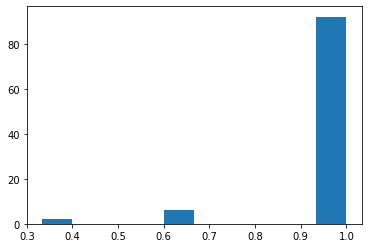

----------
partite vinte: 216370
partite con troppe mosse: 10951
girotondi: 167881
area max ultime 100 partite: 1.0
----------


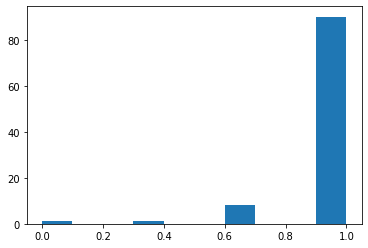

----------
partite vinte: 216406
partite con troppe mosse: 10954
girotondi: 167881
area max ultime 100 partite: 1.0
----------


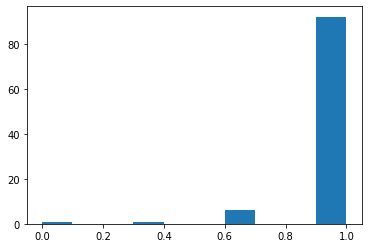

----------
partite vinte: 216526
partite con troppe mosse: 10961
girotondi: 168027
area max ultime 100 partite: 1.0
----------


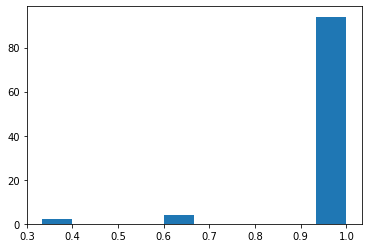

----------
partite vinte: 217120
partite con troppe mosse: 10994
girotondi: 168719
area max ultime 100 partite: 1.0
----------


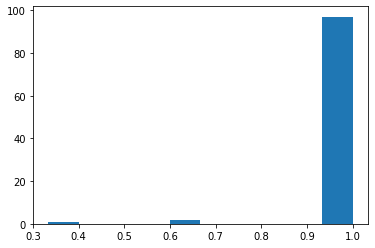

----------
partite vinte: 217228
partite con troppe mosse: 11006
girotondi: 168970
area max ultime 100 partite: 1.0
----------


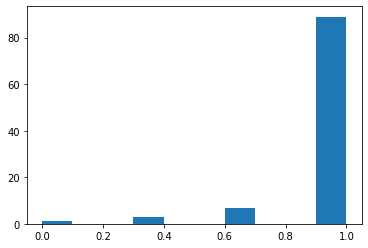

----------
partite vinte: 217239
partite con troppe mosse: 11007
girotondi: 168984
area max ultime 100 partite: 1.0
----------


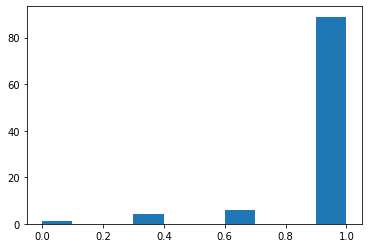

----------
partite vinte: 217344
partite con troppe mosse: 11015
girotondi: 169129
area max ultime 100 partite: 1.0
----------


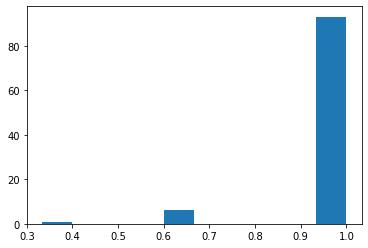

----------
partite vinte: 217454
partite con troppe mosse: 11018
girotondi: 169199
area max ultime 100 partite: 1.0
----------


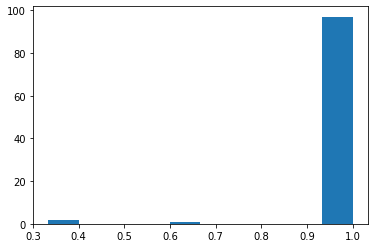

----------
partite vinte: 217922
partite con troppe mosse: 11051
girotondi: 170012
area max ultime 100 partite: 1.0
----------


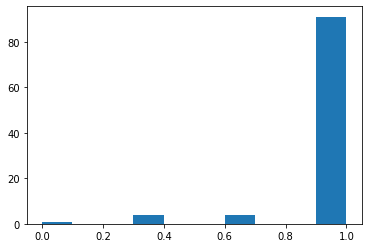

----------
partite vinte: 218104
partite con troppe mosse: 11066
girotondi: 170232
area max ultime 100 partite: 1.0
----------


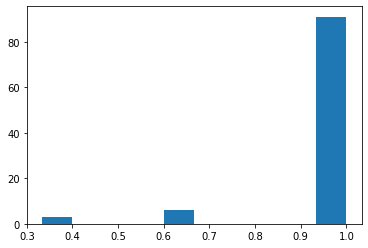

----------
partite vinte: 218242
partite con troppe mosse: 11077
girotondi: 170232
area max ultime 100 partite: 1.0
----------


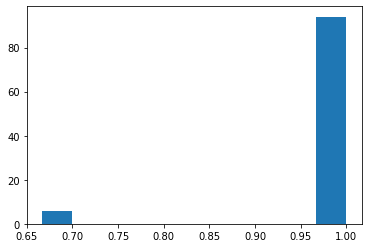

----------
partite vinte: 218400
partite con troppe mosse: 11086
girotondi: 170311
area max ultime 100 partite: 1.0
----------


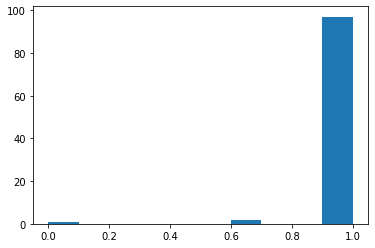

----------
partite vinte: 218626
partite con troppe mosse: 11096
girotondi: 170659
area max ultime 100 partite: 1.0
----------


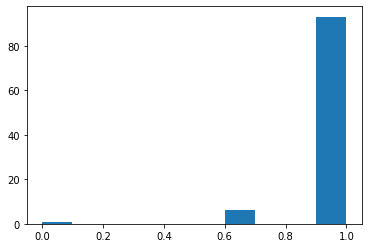

----------
partite vinte: 218723
partite con troppe mosse: 11103
girotondi: 170672
area max ultime 100 partite: 1.0
----------


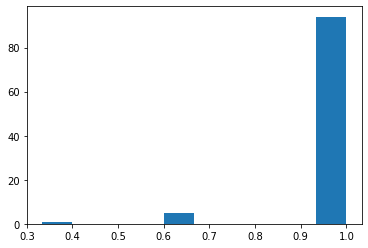

----------
partite vinte: 218902
partite con troppe mosse: 11114
girotondi: 170748
area max ultime 100 partite: 1.0
----------


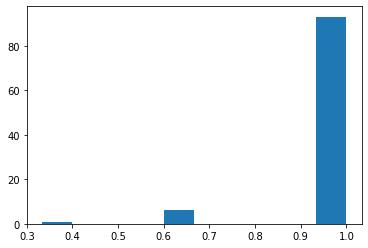

----------
partite vinte: 219035
partite con troppe mosse: 11125
girotondi: 170883
area max ultime 100 partite: 1.0
----------


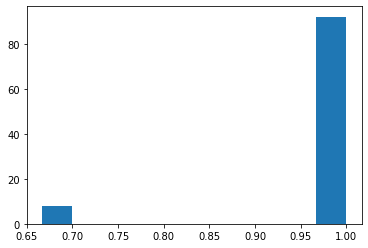

----------
partite vinte: 219135
partite con troppe mosse: 11128
girotondi: 170930
area max ultime 100 partite: 1.0
----------


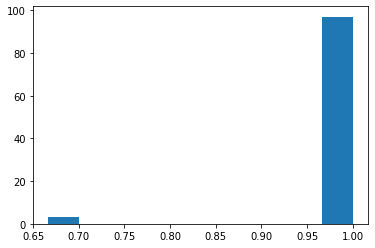

----------
partite vinte: 219195
partite con troppe mosse: 11132
girotondi: 171014
area max ultime 100 partite: 1.0
----------


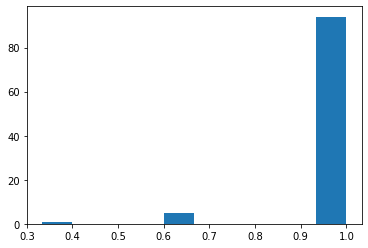

----------
partite vinte: 219429
partite con troppe mosse: 11153
girotondi: 171767
area max ultime 100 partite: 1.0
----------


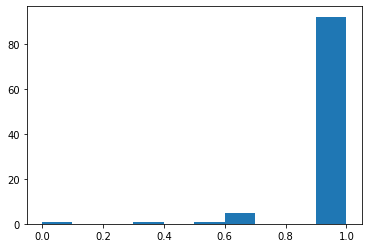

----------
partite vinte: 219795
partite con troppe mosse: 11176
girotondi: 171888
area max ultime 100 partite: 1.0
----------


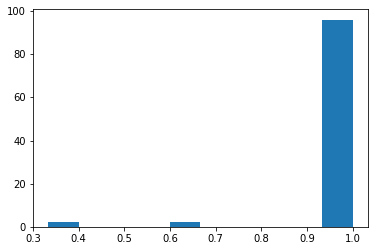

----------
partite vinte: 219875
partite con troppe mosse: 11176
girotondi: 171888
area max ultime 100 partite: 1.0
----------


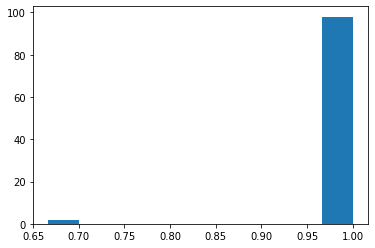

----------
partite vinte: 220050
partite con troppe mosse: 11180
girotondi: 171988
area max ultime 100 partite: 1.0
----------


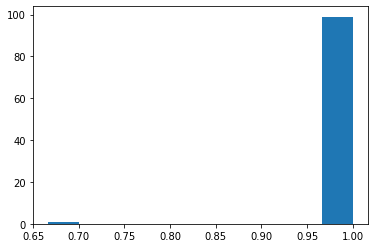

----------
partite vinte: 220084
partite con troppe mosse: 11181
girotondi: 171988
area max ultime 100 partite: 1.0
----------


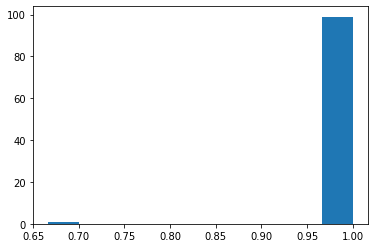

----------
partite vinte: 220116
partite con troppe mosse: 11186
girotondi: 172182
area max ultime 100 partite: 1.0
----------


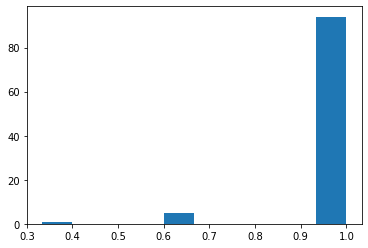

----------
partite vinte: 220130
partite con troppe mosse: 11188
girotondi: 172182
area max ultime 100 partite: 1.0
----------


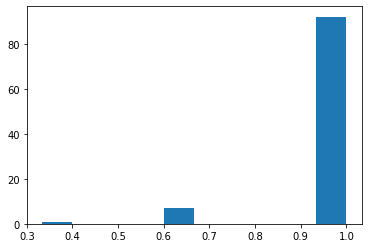

----------
partite vinte: 220510
partite con troppe mosse: 11212
girotondi: 173061
area max ultime 100 partite: 1.0
----------


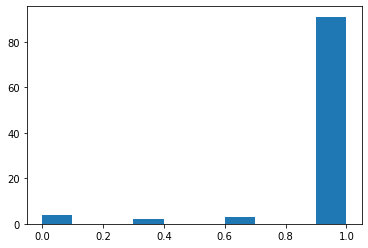

----------
partite vinte: 220558
partite con troppe mosse: 11213
girotondi: 173061
area max ultime 100 partite: 1.0
----------


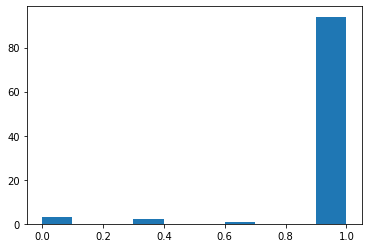

----------
partite vinte: 220621
partite con troppe mosse: 11216
girotondi: 173109
area max ultime 100 partite: 1.0
----------


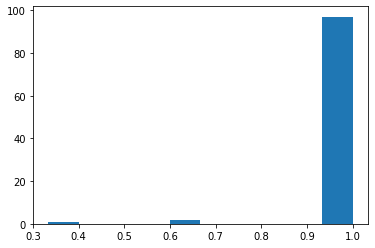

----------
partite vinte: 221041
partite con troppe mosse: 11237
girotondi: 173546
area max ultime 100 partite: 1.0
----------


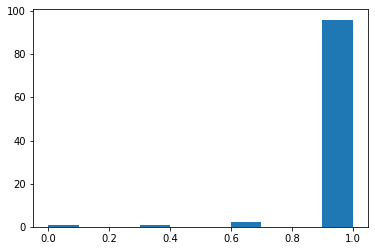

----------
partite vinte: 221183
partite con troppe mosse: 11247
girotondi: 173697
area max ultime 100 partite: 1.0
----------


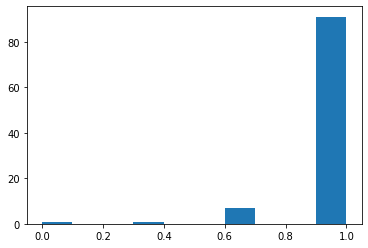

----------
partite vinte: 221198
partite con troppe mosse: 11247
girotondi: 173697
area max ultime 100 partite: 1.0
----------


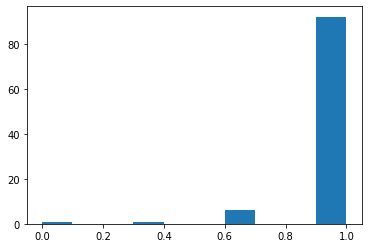

----------
partite vinte: 221308
partite con troppe mosse: 11253
girotondi: 173717
area max ultime 100 partite: 1.0
----------


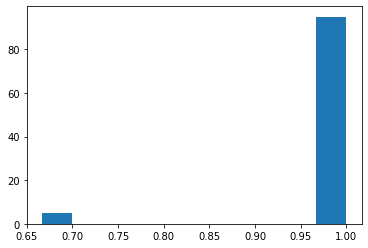

----------
partite vinte: 222028
partite con troppe mosse: 11284
girotondi: 174545
area max ultime 100 partite: 1.0
----------


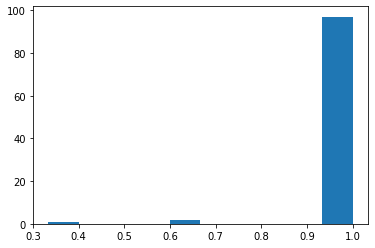

----------
partite vinte: 222044
partite con troppe mosse: 11284
girotondi: 174545
area max ultime 100 partite: 1.0
----------


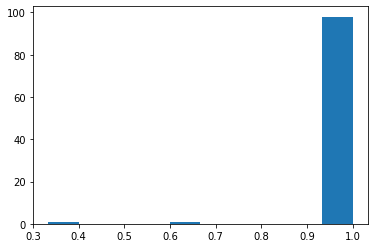

----------
partite vinte: 222049
partite con troppe mosse: 11284
girotondi: 174586
area max ultime 100 partite: 1.0
----------


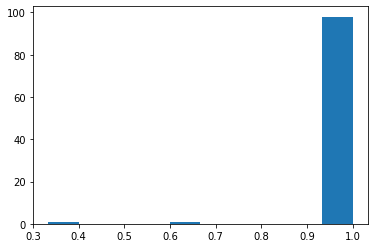

----------
partite vinte: 222654
partite con troppe mosse: 11319
girotondi: 175306
area max ultime 100 partite: 1.0
----------


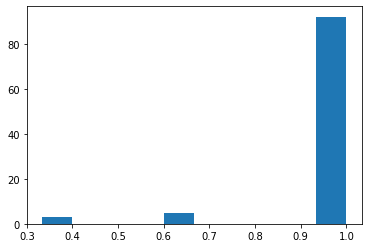

----------
partite vinte: 223359
partite con troppe mosse: 11359
girotondi: 176268
area max ultime 100 partite: 1.0
----------


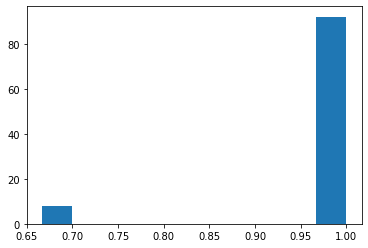

----------
partite vinte: 223883
partite con troppe mosse: 11391
girotondi: 176701
area max ultime 100 partite: 1.0
----------


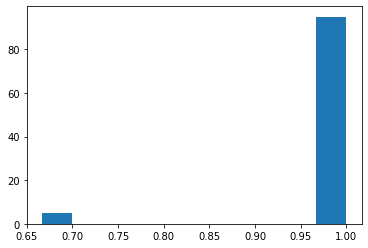

----------
partite vinte: 224130
partite con troppe mosse: 11403
girotondi: 176868
area max ultime 100 partite: 1.0
----------


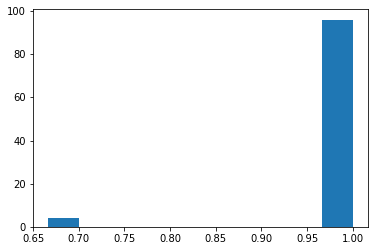

----------
partite vinte: 224327
partite con troppe mosse: 11414
girotondi: 177122
area max ultime 100 partite: 1.0
----------


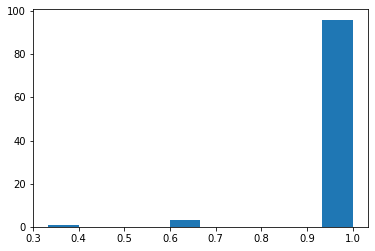

----------
partite vinte: 225140
partite con troppe mosse: 11451
girotondi: 178234
area max ultime 100 partite: 1.0
----------


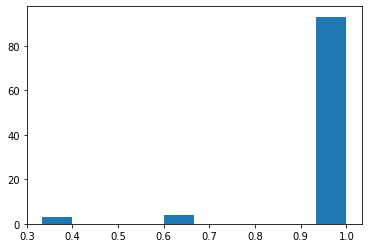

----------
partite vinte: 225307
partite con troppe mosse: 11458
girotondi: 178361
area max ultime 100 partite: 1.0
----------


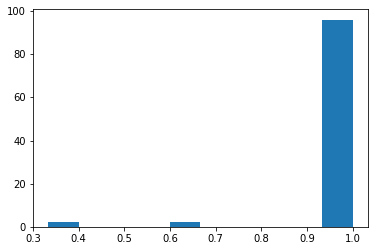

----------
partite vinte: 225521
partite con troppe mosse: 11464
girotondi: 178426
area max ultime 100 partite: 1.0
----------


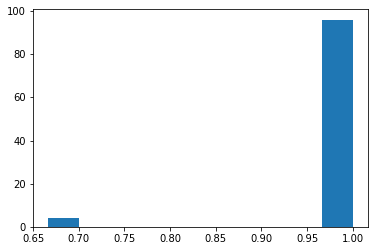

----------
partite vinte: 225543
partite con troppe mosse: 11465
girotondi: 178479
area max ultime 100 partite: 1.0
----------


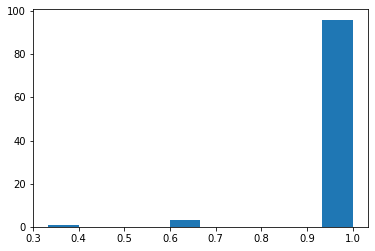

----------
partite vinte: 225594
partite con troppe mosse: 11465
girotondi: 178479
area max ultime 100 partite: 1.0
----------


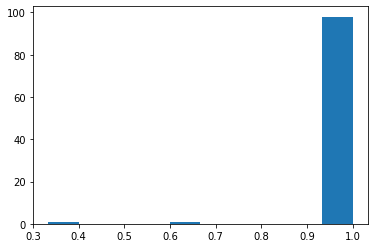

----------
partite vinte: 225612
partite con troppe mosse: 11467
girotondi: 178479
area max ultime 100 partite: 1.0
----------


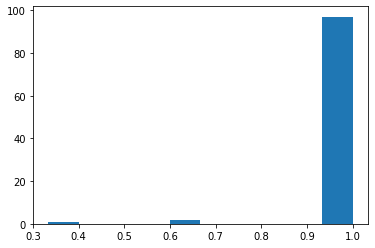

----------
partite vinte: 225643
partite con troppe mosse: 11470
girotondi: 178605
area max ultime 100 partite: 1.0
----------


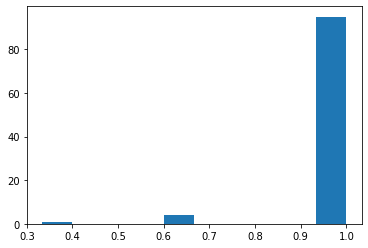

----------
partite vinte: 225665
partite con troppe mosse: 11471
girotondi: 178605
area max ultime 100 partite: 1.0
----------


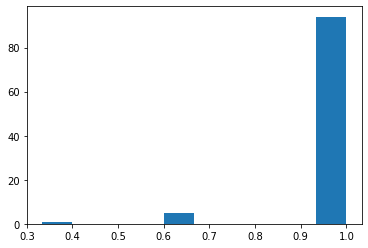

----------
partite vinte: 225666
partite con troppe mosse: 11471
girotondi: 178605
area max ultime 100 partite: 1.0
----------


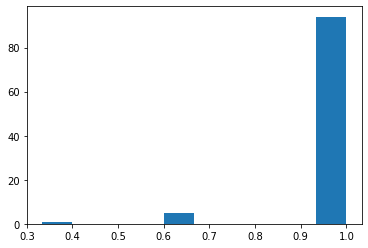

----------
partite vinte: 225913
partite con troppe mosse: 11477
girotondi: 178638
area max ultime 100 partite: 1.0
----------


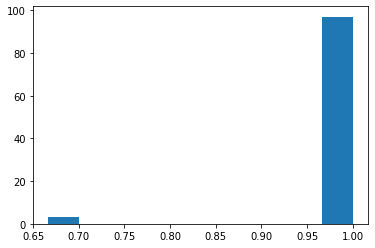

----------
partite vinte: 225933
partite con troppe mosse: 11481
girotondi: 178703
area max ultime 100 partite: 1.0
----------


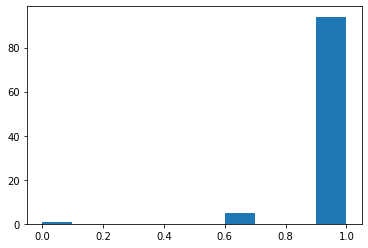

----------
partite vinte: 226123
partite con troppe mosse: 11491
girotondi: 178746
area max ultime 100 partite: 1.0
----------


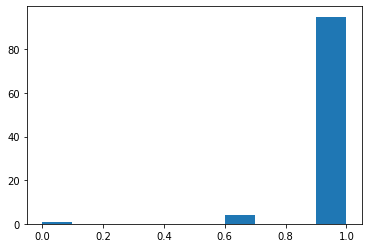

----------
partite vinte: 226323
partite con troppe mosse: 11502
girotondi: 178962
area max ultime 100 partite: 1.0
----------


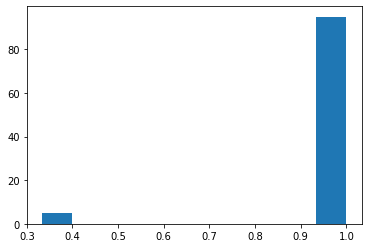

----------
partite vinte: 226341
partite con troppe mosse: 11503
girotondi: 178962
area max ultime 100 partite: 1.0
----------


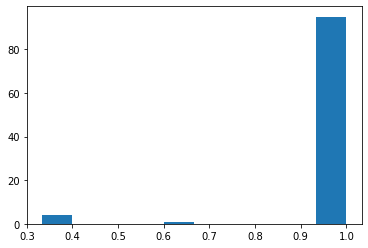

----------
partite vinte: 226422
partite con troppe mosse: 11511
girotondi: 178994
area max ultime 100 partite: 1.0
----------


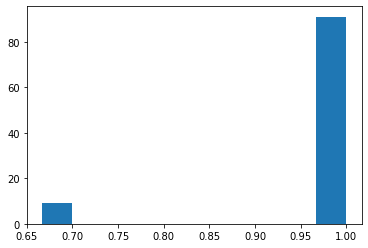

----------
partite vinte: 226639
partite con troppe mosse: 11521
girotondi: 179013
area max ultime 100 partite: 1.0
----------


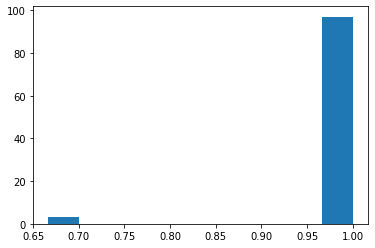

----------
partite vinte: 226843
partite con troppe mosse: 11535
girotondi: 179474
area max ultime 100 partite: 1.0
----------


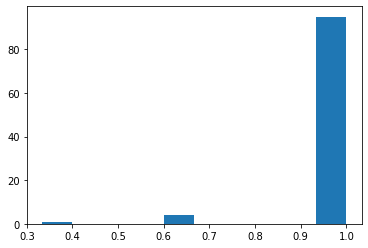

----------
partite vinte: 227034
partite con troppe mosse: 11547
girotondi: 179553
area max ultime 100 partite: 1.0
----------


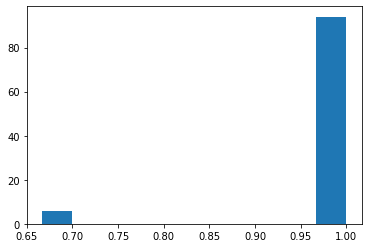

----------
partite vinte: 227109
partite con troppe mosse: 11549
girotondi: 179562
area max ultime 100 partite: 1.0
----------


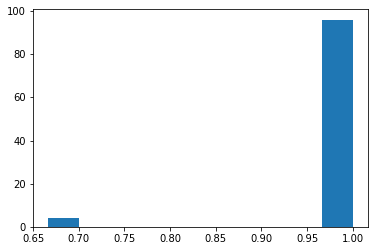

----------
partite vinte: 227147
partite con troppe mosse: 11552
girotondi: 179570
area max ultime 100 partite: 1.0
----------


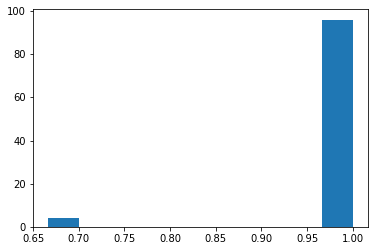

----------
partite vinte: 227208
partite con troppe mosse: 11553
girotondi: 179674
area max ultime 100 partite: 1.0
----------


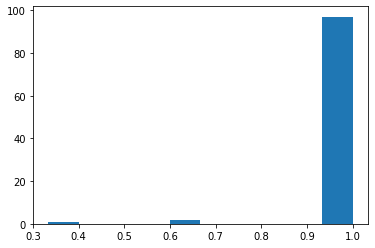

----------
partite vinte: 227522
partite con troppe mosse: 11561
girotondi: 180024
area max ultime 100 partite: 1.0
----------


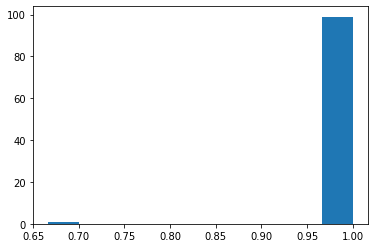

----------
partite vinte: 227576
partite con troppe mosse: 11564
girotondi: 180054
area max ultime 100 partite: 1.0
----------


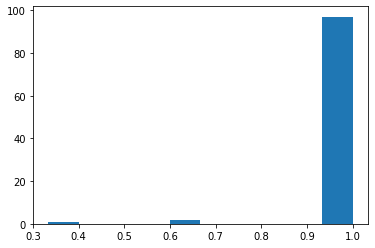

----------
partite vinte: 227609
partite con troppe mosse: 11567
girotondi: 180076
area max ultime 100 partite: 1.0
----------


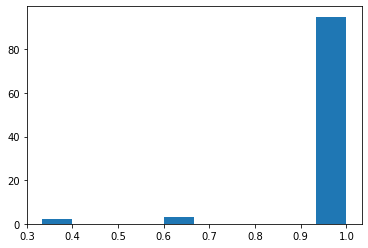

----------
partite vinte: 227823
partite con troppe mosse: 11578
girotondi: 180221
area max ultime 100 partite: 1.0
----------


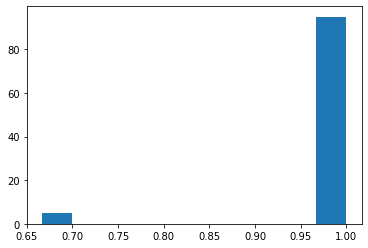

----------
partite vinte: 227893
partite con troppe mosse: 11583
girotondi: 180265
area max ultime 100 partite: 1.0
----------


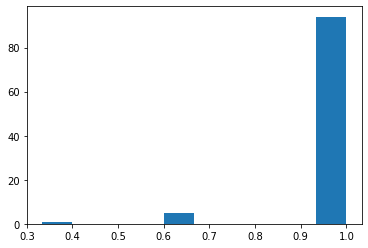

----------
partite vinte: 228615
partite con troppe mosse: 11617
girotondi: 181102
area max ultime 100 partite: 1.0
----------


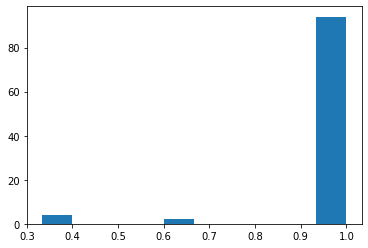

----------
partite vinte: 228633
partite con troppe mosse: 11618
girotondi: 181133
area max ultime 100 partite: 1.0
----------


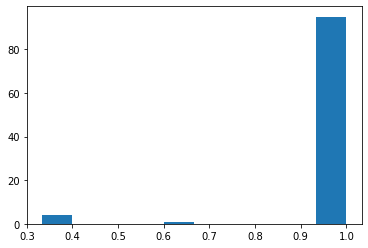

----------
partite vinte: 228959
partite con troppe mosse: 11630
girotondi: 181150
area max ultime 100 partite: 1.0
----------


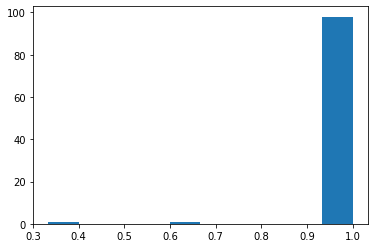

----------
partite vinte: 229329
partite con troppe mosse: 11652
girotondi: 181937
area max ultime 100 partite: 1.0
----------


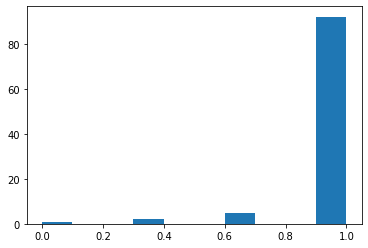

----------
partite vinte: 229397
partite con troppe mosse: 11659
girotondi: 182034
area max ultime 100 partite: 1.0
----------


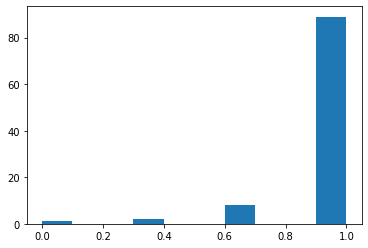

----------
partite vinte: 229576
partite con troppe mosse: 11670
girotondi: 182039
area max ultime 100 partite: 1.0
----------


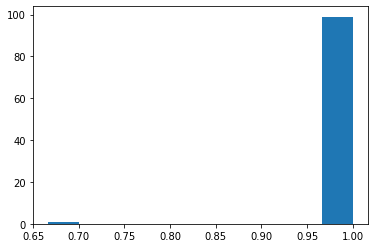

----------
partite vinte: 230002
partite con troppe mosse: 11694
girotondi: 182851
area max ultime 100 partite: 1.0
----------


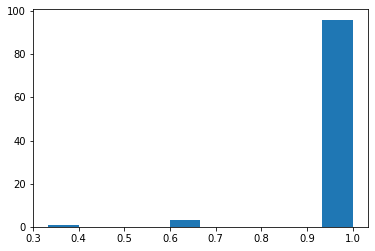

----------
partite vinte: 230182
partite con troppe mosse: 11706
girotondi: 183215
area max ultime 100 partite: 1.0
----------


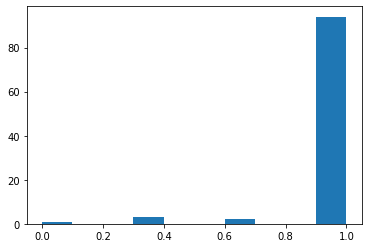

----------
partite vinte: 230266
partite con troppe mosse: 11709
girotondi: 183222
area max ultime 100 partite: 1.0
----------


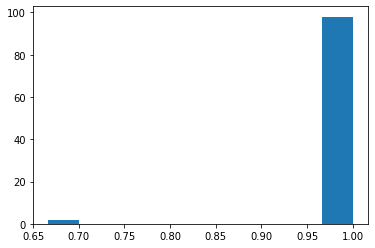

----------
partite vinte: 230486
partite con troppe mosse: 11722
girotondi: 183521
area max ultime 100 partite: 1.0
----------


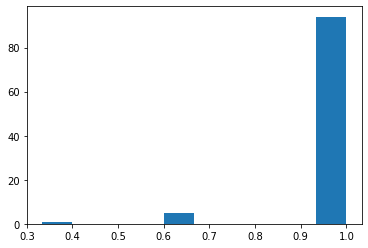

----------
partite vinte: 230498
partite con troppe mosse: 11722
girotondi: 183537
area max ultime 100 partite: 1.0
----------


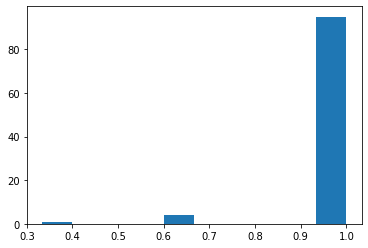

----------
partite vinte: 230528
partite con troppe mosse: 11723
girotondi: 183537
area max ultime 100 partite: 1.0
----------


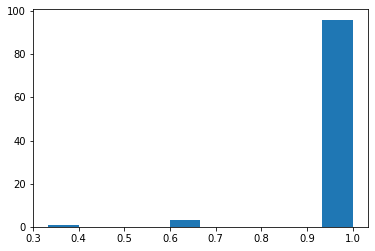

----------
partite vinte: 230766
partite con troppe mosse: 11734
girotondi: 184116
area max ultime 100 partite: 1.0
----------


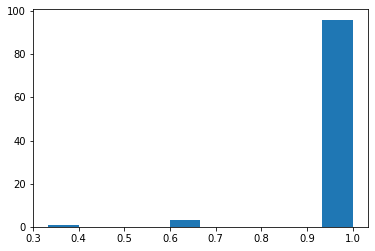

----------
partite vinte: 231200
partite con troppe mosse: 11748
girotondi: 184253
area max ultime 100 partite: 1.0
----------


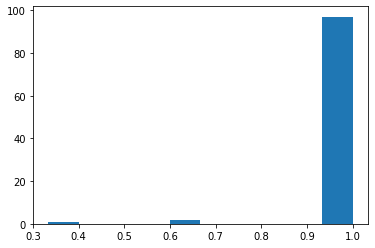

----------
partite vinte: 231229
partite con troppe mosse: 11748
girotondi: 184253
area max ultime 100 partite: 1.0
----------


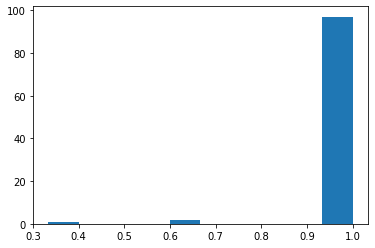

----------
partite vinte: 231295
partite con troppe mosse: 11751
girotondi: 184260
area max ultime 100 partite: 1.0
----------


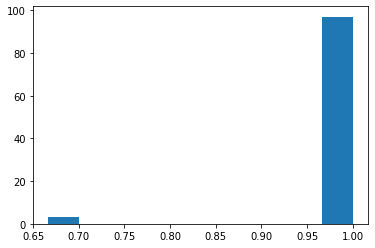

----------
partite vinte: 231295
partite con troppe mosse: 11752
girotondi: 184261
area max ultime 100 partite: 1.0
----------


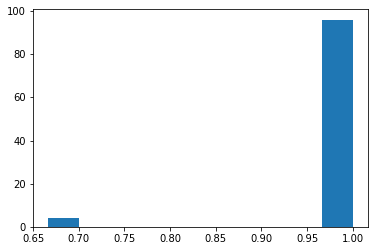

----------
partite vinte: 231959
partite con troppe mosse: 11783
girotondi: 184846
area max ultime 100 partite: 1.0
----------


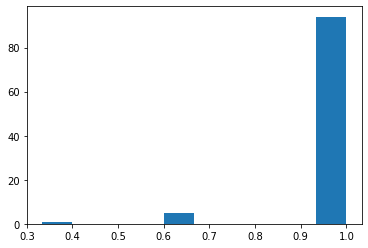

----------
partite vinte: 232017
partite con troppe mosse: 11783
girotondi: 184901
area max ultime 100 partite: 1.0
----------


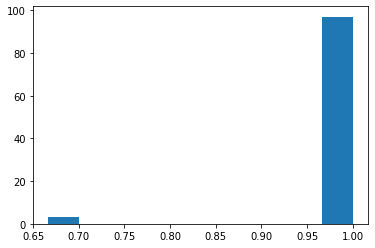

----------
partite vinte: 232017
partite con troppe mosse: 11783
girotondi: 184901
area max ultime 100 partite: 1.0
----------


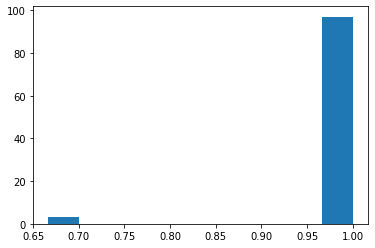

----------
partite vinte: 232200
partite con troppe mosse: 11789
girotondi: 185123
area max ultime 100 partite: 1.0
----------


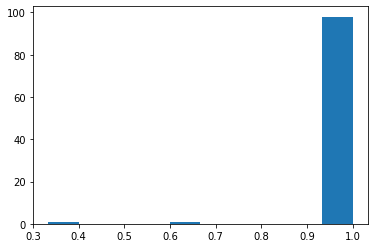

In [ ]:
# ho pensato di ridurre omega max per far fare meno curve
# ho pensato anche di allungare la lista di azioni dopo cui far morire
# ho pensato di aumentare la rete
# ho pensato di usare l'entropia

# Train the agent for 10000 steps


#PROVA AD AGGIUNGERE UNA PICCOLA PENALTY SULLE BARRIERE

model.learn(total_timesteps=3000000)
#model.save("PPO_checkpoint_")
#!cp PPO_checkpoint_.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

In [ ]:
model.save("weee")

In [ ]:
# quello di prima è il nostop venuto abbastanza bene
#import os.path
#os.mkdir('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_2_SMALL_MAP')
model.save("MODELLO_STRUCTURE_2_SMALL_MAP")
!cp MODELLO_STRUCTURE_2_SMALL_MAP.zip /content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_2_SMALL_MAP

### Video making

In [ ]:
import shutil

shutil.rmtree('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2')

In [ ]:
import os.path
os.mkdir('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2')

[[0.41016769 0.3030303  0.19589291 0.15151515 0.10713739 0.06275963
  0.10713739 0.21427478 0.32141217 0.36578993 0.32141217 0.21427478
  0.10713739 0.10713739 0.10713739 0.10713739 0.10713739 0.21427478
  0.32141217 0.42854956 0.53568696 0.64282435 0.74996174 0.85709913
  0.97609885 0.         0.         0.         0.         0.        ]
 [0.89286261 0.84848485 0.80410709 0.6969697  0.58983231 0.48269491
  0.37555752 0.33117976 0.286802   0.17966461 0.07252722 0.02814946
  0.07252722 0.07252722 0.07252722 0.07252722 0.07252722 0.02814946
  0.07252722 0.11690498 0.16128274 0.2056605  0.25003826 0.29441602
  0.29441602 0.         0.         0.         0.         0.        ]
 [0.625      0.5        0.625      0.75       0.625      0.75
  0.875      1.         0.875      0.75       0.625      0.5
  0.375      0.5        0.625      0.75       0.875      1.
  0.125      0.         0.125      0.         0.125      0.
  0.         0.         0.         0.         0.         0.        ]]


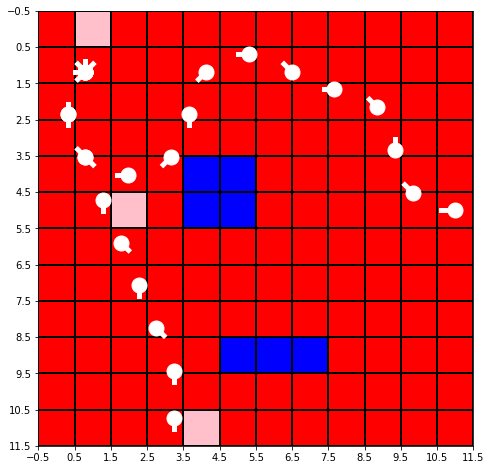

In [ ]:
episodes = 1
from google.colab import files
lista_ros_stati=np.zeros((3,30))
for episode in range(1, episodes+1):
    done = False
    obs = env.reset()
    score = 0 
    plottagrid(env.reward_grid)
    lista_ros_stati[:,0]=env.state[0:3]
    j=0
    for i in range(100):
        
        if done==True:
          #plt.savefig("/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2/"+"episodio"+str(i)+".jpg", dpi=150)
          print(lista_ros_stati)
          break
 
        action, _states = model.predict(obs)

        n_state, reward, done, info = env.step(action)
        lista_ros_stati[:,i]=n_state[0:3]
        plt.plot([env.state[1]*(size_y-1),env.state[1]*(size_y-1)+0.3*np.sin(env.state[2]*2*np.pi)],[env.state[0]*(size_x-1),env.state[0]*(size_x-1)+0.3*np.cos(env.state[2]*2*np.pi)],linewidth=5,color='white')
        plt.plot(env.state[1]*(size_y-1), env.state[0]*(size_x-1), marker="o", markersize=15, markeredgecolor="white", markerfacecolor="white")
        j=j+1
        #plt.savefig("/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2/"+"sample"+str(i)+".jpg", dpi=150)
        

       

In [ ]:
import cv2
import numpy as np
import glob

img_array = []
for filename in glob.glob('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2/*.jpg'):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)


out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 3, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

In [ ]:
from google.colab import files
!ffmpeg -i project.avi output.mp4
files.download('output.mp4') 
# .avi to mov
#https://www.movavi.com/support/how-to/how-to-convert-avi-to-mov.html

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!ffmpeg -i project.avi output.mp4

from IPython.display import HTML
from base64 import b64encode
mp4 = open('output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

# environment 2 big map






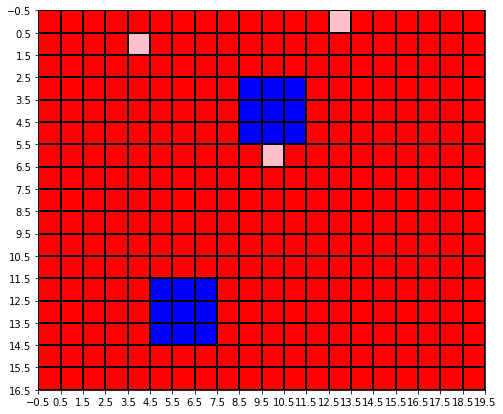

In [ ]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

def Convert(string):
    string=string.replace("[","")
    string=string.replace("]","")
    li = list(string.split(", "))
    li=[float(i) for i in li]
    return li


gain=1
penalty=0.0
size_x=17
size_y=20
mosse_max=500

flag_robot_su_griglia=-1

'''
v_mid=0.5
v_small=0.3
omega_max=0.5
delta_t=np.pi/2
'''


v_mid=0.5
omega_max=0.3
delta_t=(2*np.pi/(8*omega_max))

numero_mosse_massime=[0]
numero_partite_vinte=[0]
reward_listone=[]
lista_aree=[]
sparse_reward=True
girotondi=[0]

def init_reward_grid():
    grid=np.zeros((17,20))
    #print(a)
    somma=0
    a=0
    b=0
    c=0
    d=0
    e=0
    f=0
    while a+b+c+d+e+f<4:
      a=random.randint(0,1)
      b=random.randint(0,1)
      c=random.randint(0,1)
      d=random.randint(0,1)
      e=random.randint(0,1)
      f=random.randint(0,1)
    if random.randint(0,2)==2 or a+b+c+d+e+f==3:
      a=1
      b=1
      c=1
      d=1
      e=1
      f=1


        
    grid[random.randint(0,2),random.randint(9,11)]=a
    grid[random.randint(14,16),random.randint(5,7)]=b
    grid[random.randint(0,3),random.randint(0,4)]=c


    grid[random.randint(0,6),random.randint(12,18)]=d

    grid[3:6,9:12]=-2
    grid[random.randint(4,15),random.randint(0,4)]=e

    grid[random.randint(6,16),random.randint(8,11)]=f
    grid[12:15,5:8]=-2
    
    #grid[11:13,14:16]=np.ones((2,2))*(-1.9)

    grigliona_pixel=copy.copy(grid)#NON SI SMETTE MAI DI IMPARARE

    for i in range(17):
        for j in range(20):
            if grigliona_pixel[i,j]>0:
                somma+=grigliona_pixel[i,j]
                grigliona_pixel[i,j]=1

    return grid,somma,grigliona_pixel

cmap = colors.ListedColormap(['blue', 'red','green','pink'])

bounds = [-2,-0.1,0.3,0.7,1]
norm = colors.BoundaryNorm(bounds, cmap.N)
    

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(init_reward_grid()[0], cmap=cmap,norm=norm)
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
ax.set_xticks(np.arange(-0.5, size_y, 1));
        
ax.set_yticks(np.arange(-0.5, size_x, 1)); 





#define a function that determines if the specified location is a terminal state
def is_terminal_state(initial_x, initial_y):
  #if the reward for this location is -1, then it is not a terminal state (i.e., it is a 'white square')
  current_row_index=int(np.round(initial_x))
  current_column_index=int(np.round(initial_y))
  #print(current_row_index,current_column_index)
  reward=0
  lista=env.reward_grid[np.max([0,current_row_index-1]):np.min([current_row_index+2,19]),np.max([current_column_index-1,0]):np.min([current_column_index+2,19])].reshape(-1)
  for i  in range(len(lista)):
      if lista[i]>0:
          reward+=lista[i]

  if reward >0 or env.reward_grid[current_row_index, current_column_index] <-0.5:
    return True
  else:
    
    angolone=env.state[2]*np.pi*2 
    nuovo_x=initial_x+2*np.cos(angolone)*v_mid
    nuovo_y=initial_y+2*np.sin(angolone)*v_mid
    #print('1',nuovo_x,nuovo_y,angolone)
    if env.reward_grid[int(np.round(nuovo_x)), int(np.round(nuovo_y))] <-0.5:
        return True
    else:
        omega_=[omega_max,0,-omega_max]
        for i in omega_:
            c=angolone+2*i
            a=initial_x+2*np.cos(c)*v_mid
            b=initial_y+2*np.sin(c)*v_mid
            #print('2',a,b,c)
            if env.reward_grid[int(np.round(a)), int(np.round(b))] >-0.5:
                return False
    
def ricompensa(lista):
    reward=0
    for i  in range(len(lista)):
        if lista[i]>0:
            reward+=lista[i]
    return reward

def resetta(x,y):
    for i in range(-1,2):
        for j in range(-1,2):
            if x+i<size_x and x+i>=0 and y+j<size_y and y+j>=0:
                if env.reward_grid[x+i,y+j]>0:
                    env.reward_grid[x+i,y+j]=0
                    env.pixel_grid[x+i,y+j]=0
    


#define a function that will choose a random, non-terminal starting location
def get_starting_location():
  #get a random row and column index
  kkk=1#random.randint(0,1)
  if kkk>0:
    #return 11, 19, 0.75# case for huge map
    return 5, 11, 0.75




def vectorize_map(map):
    # map è init_pixel_grid() quindi booleana, contiene 1 dove sta la monnezza, 
    # -2 dove stanno le mura, -1 dove sta il robot e il resto 0
    vector = [i for i in np.reshape(map,-1) if i>-2]
    return vector
size=len(vectorize_map(init_reward_grid()[0]))


In [ ]:



action_list=[
             [v_mid,-omega_max],
             [v_mid,omega_max],
             [v_mid,0],
             ]



class PiazzaDelPopolo(Env):
    

    def __init__(self):
        
        pos_x_init=0
        pos_y_init=0
        theta_in=0
        
        self.reward_grid=[]
        self.pixel_grid=[]
        
        self.state=np.zeros(size+4)
       
        self.state[4:size+4] = np.zeros(size)
        self.state[0:4] = [pos_x_init/size_x,pos_y_init/size_y,theta_in,0]

        #self.action_space = self.action_space = Discrete(len(action_list))
        self.action_space = Discrete(len(action_list))
        highh=np.concatenate((np.array([1,1,1,1]),np.ones(size)))
        loww= np.concatenate((np.array([0,0,0,0]),-np.ones(size)))
        
            
        self.observation_space = Box(low=loww,high=highh)
        # x y theta battery %completata - pixels
        
        # l'area coperta all'inizio è zero quindi manca ancora 1
        self.stato_memoria=[]
        self.action_sequence=list(np.ones(25))
      
        self.mossa=0
    


    def step(self, action):
             
        if self.mossa >mosse_max:
            #print('allora')
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        # metto a zero l'elemento della pixel grid in cui stava prima il robot
        self.pixel_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]=0
        self.mossa+=1
        #if True==False:
        if random.randint(0,15000)==5:
            print('----------')
            print('partite vinte:',numero_partite_vinte[0])
            print('partite con troppe mosse:',numero_mosse_massime[0])
            print('girotondi:',girotondi[0])
            print('area max ultime 100 partite:',np.max(lista_aree[len(lista_aree)-100:]))
            print('----------')
            plt.figure()
            plt.hist(lista_aree[len(lista_aree)-100:])
            plt.show()
        
           #prima -0.5 era troppo
        self.stato_memoria=[self.state[0],self.state[1]]

        self.action_sequence.append(action)
        self.action_sequence=self.action_sequence[1:]
        if self.state[0]<=1 and self.state[0]>=0 and self.state[1]<=1 and self.state[1]>=0:       
            '''
            angolone=self.state[2]*np.pi*2
            self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
            self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)'''
            angolone=self.state[2]*np.pi*2
            if action==2:
                self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
                self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            else:
                
                self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
                
                self.state[0]+=(action_list[action][0]/action_list[action][1])*(np.sin(self.state[2]*2*np.pi)-np.sin(angolone))/(size_x-1)
                self.state[1]-=(action_list[action][0]/action_list[action][1])*(np.cos(self.state[2]*2*np.pi)-np.cos(angolone))/(size_y-1)
          
            
        if self.state[2]>1:
            self.state[2]-=1
        if self.state[2]<0:
            self.state[2]+=1
            
        ollare=False
        if self.state[0]>=1:
            
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[0]<=0:
            
            done=ollare
            reward=-penalty
            #
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]>=1:
            
            done=ollare
            reward=-penalty
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            self.state[0:2]=self.stato_memoria
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]<=0:
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''

        
        if self.reward_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]<-1.6:
            done =ollare
            reward=-penalty
            
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info={}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            

        # battery decrease
        
        
        

        
        pos_x=int(np.round(self.state[0]*(size_x-1)))
        pos_y=int(np.round(self.state[1]*(size_y-1)))

        
        

        # prende il valore della casella : 
        
        reward=ricompensa(self.reward_grid[np.max([0,pos_x-1]):np.min([pos_x+2,19]),np.max([pos_y-1,0]):np.min([pos_y+2,19])].reshape(-1))
        
        # metto a 3 l'elemento della pixel grid in cui sta attualmente il robot
        self.pixel_grid[pos_x,pos_y]=flag_robot_su_griglia

#-------Garbage collected----------------------------------------        
        if reward>0:
            #print('preso',reward)
            #remove garbage from square
            resetta(pos_x,pos_y)
            self.state[3]+=reward/self.somma
        
        # AGGIORNO LO STATO!!!!!! MI ERO DIMENTICATO
        #if len(vectorize_map(self.pixel_grid))>size:
        #  plottagrid(self.pixel_grid.reshape(size_x,size_y))
          
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
         #define a function that determines if the specified location is a terminal state
        
        if self.mossa >mosse_max:
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        else: 
            done=False
            
        if self.state[3]>=0.99:# il 3 è l'AREA COPERTA!!!!
            reward=1
            lista_aree.append(self.state[3])
            numero_partite_vinte[0]+=1
            #print('we')
            done=True
            info={}
            return self.state, reward, done, info
        if self.action_sequence.count(0)>23 or self.action_sequence.count(2)>23:
            girotondi[0]+=1

   
        

        info = {}
        reward=reward*0.5*(1+self.state[3])**2
  

        # Return step information
        return self.state, reward, done, info

       #elif self.action_sequence.count(0)>20 or self.action_sequence.count(2)>20:
       #     print('olle',self.action_sequence)
        #    reward=0
         #   lista_aree.append(self.state[3])
          #  numero_mosse_massime[0]+=1
           # done=False
#elif self.action_sequence.count(0)>25 or self.action_sequence.count(2)>25:
#print('olle',self.action_sequence)
#reward=-1
#lista_aree.append(self.state[3])
#numero_mosse_massime[0]+=1
#done=True

    def render(self):
        pass
    
    
    
    def reset(self):
        self.state=np.zeros(size+4)
        
       
        #print(a)
        
        self.GRIGLIA_INIZIALE=init_reward_grid()

        self.reward_grid=self.GRIGLIA_INIZIALE[0]
        
        
        
        self.somma=self.GRIGLIA_INIZIALE[1]
        #print('somma',self.somma)
        self.pixel_grid=self.GRIGLIA_INIZIALE[2]
        
        pos_x_reset,pos_y_reset,theta_in=get_starting_location() #this is integer
        #theta_in=random.uniform(0,1)
        self.state[2]=theta_in
        #pos_x_reset,pos_y_reset=[11,16]
        self.pixel_grid[pos_x_reset,pos_y_reset]=flag_robot_su_griglia
        
        self.state[0:2] = [pos_x_reset/(size_x-1),pos_y_reset/(size_y-1)]
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
        
     
        self.mossa=0
        
        
        return self.state

# FONDAMENTALE PER CREARE L ENVIRONMENT
env=PiazzaDelPopolo()

def plottagrid(matrice):
    
    px=env.state[0]*(size_x-1)
    py=env.state[1]*(size_y-1)
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    theta=env.state[2]*2*np.pi
    lungo=0.4

    fig, ax = plt.subplots(figsize=(8, 8))
   
    ax.imshow(matrice, cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));
        
    ax.set_yticks(np.arange(-0.5, 17, 1)); 
 
    plt.plot([py,py+lungo*np.sin(theta)],[px,px+lungo*np.cos(theta)],linewidth=5,color='white')
    plt.plot(py, px, marker="o", markersize=15, markeredgecolor="white", markerfacecolor="white")


/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


In [ ]:
episodes = 1
for episode in range(1, episodes+1):
    env.reset()
    #print(np.multiply(env.reset()[0:2],size))
    #print(env.reward_grid)
    #print('batteria',env.state[3])
    done = False
    score = 0 
    plottagrid(env.reward_grid)
    #while not done:
    for i in range(10):
        if done==True:
          print('cazzo')
          print(score, env.mossa,[env.state[3],env.state[5],env.state[7],env.state[9]].count(-1))
          print([env.state[3],env.state[5],env.state[7],env.state[9]])
          break
        #env.render()
        #temp=[env.state[0],env.state[1]]
        action = env.action_space.sample()
        #action = 0
        n_state, reward, done, info = env.step(action)
        #print(np.round(env.reward_grid,2))
        score+=reward
        #print(np.round(env.pixel_grid,1))
        plt.plot([env.state[1]*(size_y-1),env.state[1]*(size_y-1)+0.4*np.sin(env.state[2]*2*np.pi)],[env.state[0]*(size_x-1),env.state[0]*(size_x-1)+0.4*np.cos(env.state[2]*2*np.pi)],linewidth=5,color='white')
        plt.plot(env.state[1]*(size_y-1), env.state[0]*(size_x-1), marker="o", markersize=15, markeredgecolor="white", markerfacecolor="white")

'''
from google.colab import files
plt.savefig("sample.jpg", dpi=150)
files.download("sample.jpg")'''
       

ValueError: ignored

In [ ]:
class Schedule(object):
    def value(self, step):
        """
        Value of the schedule for a given timestep

        :param step: (int) the timestep
        :return: (float) the output value for the given timestep
        """
        raise NotImplementedError

def get_linear_fn(start: float, end: float, end_fraction: float) -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        if (1 - progress_remaining) > end_fraction:
            return end
        if progress_remaining > end_fraction:
            return end
        else:
            return start + (1 - progress_remaining) * (end - start) / end_fraction

    return func



def learning_rate_custom() -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.1:
            return 0.00013
        if progress_remaining < 0.2:
            return 0.00011
        if progress_remaining < 0.3:
            return 0.0001
        if progress_remaining < 0.4:
            return 0.00009
        if progress_remaining < 0.5:
            return 0.00008
        if progress_remaining < 0.6:
            return 0.00006
        if progress_remaining < 0.7:
            return 0.00005
        if progress_remaining < 0.8:
            return 0.00003
        if progress_remaining < 0.9:
            return 0.00001
        else:
            return 0.00001

    return func

In [ ]:
#0.0000065
lrr=0.000019#0.00005,grigia,#0.00004,#0.000035
# 300 k at 0.0002
# 500 k at 0.0001
# 300 k at 0.00007
# 300 k at 0.00005
# 300 k at 0.00002
# 1 M at 0.00001
# 1 M at 0.000009
'''
policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[400, 400,400], vf=[400, 400,400])])'''

policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[300, 300,300], vf=[300, 300,300])])

primo_allenamento=False

# n_steps was 400, architecture [300, 300] , n_epochs=8

if primo_allenamento:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs,ent_coef=0.0, gamma=0.995,verbose=0,learning_rate=learning_rate_custom(),n_steps=2000,n_epochs=4,batch_size=400,tensorboard_log="./pixies_tensorboard/")
else:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs, ent_coef=0.0,gamma=0.995,verbose=0,learning_rate=0.000007,n_steps=2000,n_epochs=4,batch_size=400,tensorboard_log="./pixies_tensorboard/")
    model.set_parameters('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_2_SMALL_MAP/MODELLO_STRUCTURE_2_SMALL_MAP.zip')
    #model.set_parameters('weee.zip')
#ent_coef=0.0

#stable_baselines3.ppo.PPO(policy, env, learning_rate=0.0003, 
#                           n_steps=2048, batch_size=64, n_epochs=10, gamma=0.99,
#                            gae_lambda=0.95, clip_range=0.2, clip_range_vf=None, 
#                           normalize_advantage=True, ent_coef=0.0, vf_coef=0.5, max_grad_norm=0.5,
#                              use_sde=False, sde_sample_freq=-1, target_kl=None, tensorboard_log=None, 
#                           create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, device='auto',
#                            _init_setup_model=True)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./pixies_tensorboard/

In [ ]:


model.learn(total_timesteps=3000000)
